# Face Generation

In this project, you'll define and train a Generative Adverserial network of your own creation on a dataset of faces. Your goal is to get a generator network to generate *new* images of faces that look as realistic as possible!

The project will be broken down into a series of tasks from **defining new architectures training adversarial networks**. At the end of the notebook, you'll be able to visualize the results of your trained Generator to see how it performs; your generated samples should look like fairly realistic faces with small amounts of noise.

### Get the Data

You'll be using the [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) to train your adversarial networks.

This dataset has higher resolution images than datasets you have previously worked with (like MNIST or SVHN) you've been working with, and so, you should prepare to define deeper networks and train them for a longer time to get good results. It is suggested that you utilize a GPU for training.

### Pre-processed Data

Since the project's main focus is on building the GANs, we've done *some* of the pre-processing for you. Each of the CelebA images has been cropped to remove parts of the image that don't include a face, then resized down to 64x64x3 NumPy images. Some sample data is show below.

<img src='assets/processed_face_data.png' width=60% />

> If you are working locally, you can download this data [by clicking here](https://s3.amazonaws.com/video.udacity-data.com/topher/2018/November/5be7eb6f_processed-celeba-small/processed-celeba-small.zip)

This is a zip file that you'll need to extract in the home directory of this notebook for further loading and processing. After extracting the data, you should be left with a directory of data `processed-celeba-small/`.

In [ ]:
# run this once to unzip the file
!unzip processed-celeba-small.zip

In [1]:
from glob import glob
from typing import Tuple, Callable, Dict

import matplotlib.pyplot as plt
import numpy as np
import torch
from PIL import Image
from torch.utils.data import DataLoader, Dataset
#from torchvision.transforms import Compose, ToTensor, Resize, Normalize
import torchvision.transforms as T
import tests

In [2]:
data_dir = 'processed_celeba_small/celeba/'

## Data pipeline

The [CelebA](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations. Since you're going to be generating faces, you won't need the annotations, you'll only need the images. Note that these are color images with [3 color channels (RGB)](https://en.wikipedia.org/wiki/Channel_(digital_image)#RGB_Images) each.

### Pre-process and Load the Data

Since the project's main focus is on building the GANs, we've done *some* of the pre-processing for you. Each of the CelebA images has been cropped to remove parts of the image that don't include a face, then resized down to 64x64x3 NumPy images. This *pre-processed* dataset is a smaller subset of the very large CelebA dataset and contains roughly 30,000 images. 

Your first task consists in building the dataloader. To do so, you need to do the following:
* implement the get_transforms function
* create a custom Dataset class that reads the CelebA data

### Exercise: implement the get_transforms function

The `get_transforms` function should output a [`torchvision.transforms.Compose`](https://pytorch.org/vision/stable/generated/torchvision.transforms.Compose.html#torchvision.transforms.Compose) of different transformations. You have two constraints:
* the function takes a tuple of size as input and should **resize the images** to the input size
* the output images should have values **ranging from -1 to 1**

In [3]:
def get_transforms(size: Tuple[int, int]) -> Callable:
    """ Transforms to apply to the image."""
    # TODO: edit this function by appening transforms to the below list
    transforms = [
        T.Resize(size),
        T.ToTensor(),
        T.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])
    ]
    
    return T.Compose(transforms)

### Exercise: implement the DatasetDirectory class


The `DatasetDirectory` class is a torch Dataset that reads from the above data directory. The `__getitem__` method should output a transformed tensor and the `__len__` method should output the number of files in our dataset. You can look at [this custom dataset](https://pytorch.org/tutorials/beginner/basics/data_tutorial.html#creating-a-custom-dataset-for-your-files) for ideas. 

In [4]:
class DatasetDirectory(Dataset):
    """
    A custom dataset class that loads images from folder.
    args:
    - directory: location of the images
    - transform: transform function to apply to the images
    - extension: file 
    """
    
    ### these were the main critical lines, in order to speed up the whole process, 
    ### especially the initilisation and usage of self.data (after some research on the internet)
    ### before this, the whole cycle would have taken about 20 hours to process ;-)
    
    def __init__(self, 
                 directory: str, 
                 transforms: Callable = 0, 
                 extension: str = '.jpg'):
        # TODO: implement the init method
        self.directory= directory
        self.transforms= transforms
        self.extension= extension
        self.data = []
        
        for img in glob('{}/*{}'.format(self.directory, extension)):
            self.data.append(Image.open(img))

    def __len__(self) -> int:
        """ returns the number of items in the dataset """
        # TODO: return the number of elements in the dataset
        return self.data.__len__()

        

    def __getitem__(self, index: int) -> torch.Tensor:
        """ load an image and apply transformation """
        # TODO: return the index-element of the dataset
        return self.transforms(self.data[index])

In [5]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to verify your dataset implementation
dataset = DatasetDirectory(data_dir, get_transforms((64, 64)))
tests.check_dataset_outputs(dataset)

Congrats, your dataset implementation passed all the tests


The functions below will help you visualize images from the dataset.

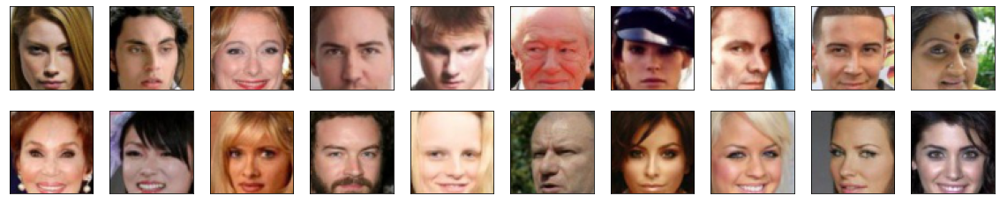

In [6]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""

def denormalize(images):
    """Transform images from [-1.0, 1.0] to [0, 255] and cast them to uint8."""
    return ((images + 1.) / 2. * 255).astype(np.uint8)

# plot the images in the batch, along with the corresponding labels
fig = plt.figure(figsize=(20, 4))
plot_size=20
for idx in np.arange(plot_size):
    ax = fig.add_subplot(2, int(plot_size/2), idx+1, xticks=[], yticks=[])
    img = dataset[idx].numpy()
    img = np.transpose(img, (1, 2, 0))
    img = denormalize(img)
    ax.imshow(img)

## Model implementation

As you know, a GAN is comprised of two adversarial networks, a discriminator and a generator. Now that we have a working data pipeline, we need to implement the discriminator and the generator. 

Feel free to implement any additional class or function.

### Exercise: Create the discriminator

The discriminator's job is to score real and fake images. You have two constraints here:
* the discriminator takes as input a **batch of 64x64x3 images**
* the output should be a single value (=score)

Feel free to get inspiration from the different architectures we talked about in the course, such as DCGAN, WGAN-GP or DRAGAN.

#### Some tips
* To scale down from the input image, you can either use `Conv2d` layers with the correct hyperparameters or Pooling layers.
* If you plan on using gradient penalty, do not use Batch Normalization layers in the discriminator.

In [7]:
import torch.nn as nn
from torch.nn import Module

In [8]:
# need to define ConvBlock according to course and according to test file
class ConvBlock(nn.Module):
    def __init__(self, in_channels: int, out_channels: int, kernel_size: int, batch_norm: bool = True):
        super(ConvBlock, self).__init__()
        
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size, stride=2, padding=1, bias=False)
        self.batch_norm = batch_norm
        if self.batch_norm:
            self.bn = nn.BatchNorm2d(out_channels)
        self.activation = nn.LeakyReLU(0.2)
        
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.conv(x)
        if self.batch_norm:
            x = self.bn(x)
        x = self.activation(x)
        return x

In [9]:
class Discriminator(Module):
    def __init__(self,  batch_norm: bool = True):
        super(Discriminator, self).__init__()
        # TODO: instantiate the different layers
        self.conv_dim= 32
        self.kernel_size= 4
        
        # 64x64 input --> 32x32 output
        self.conv1= ConvBlock(3, self.conv_dim, self.kernel_size, batch_norm= False)
        # 32x32 input --> 16x16 output
        self.conv2= ConvBlock(self.conv_dim, self.conv_dim*2, self.kernel_size)
        # 16x16 input --> 8x8 output
        self.conv3= ConvBlock(self.conv_dim*2, self.conv_dim*4, self.kernel_size)
        # 8x8 input --> 4x4 output
        self.conv4= ConvBlock(self.conv_dim*4, self.conv_dim*8, self.kernel_size)
        
        self.flatten= nn.Flatten()
        
        self.fc= nn.Linear(self.conv_dim*8*4*4, 1)
        
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        # TODO: implement the forward method
        x= self.conv1(x)
        #print(x.shape)
        x= self.conv2(x)
        #print(x.shape)
        x= self.conv3(x)
        #print(x.shape)
        x= self.conv4(x)
        #print(x.shape)
        x= self.flatten(x)
        #print(x.shape)
        x= self.fc(x)
        #print(x.shape)
        x= x.unsqueeze(1)
        x= x.unsqueeze(1)
        return x 

In [10]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to check your discriminator implementation
discriminator = Discriminator()
tests.check_discriminator(discriminator)

Congrats, your discriminator implementation passed all the tests


### Exercise: create the generator

The generator's job creates the "fake images" and learns the dataset distribution. You have three constraints here:
* the generator takes as input a vector of dimension `[batch_size, latent_dimension, 1, 1]`
* the generator must outputs **64x64x3 images**

Feel free to get inspiration from the different architectures we talked about in the course, such as DCGAN, WGAN-GP or DRAGAN.

#### Some tips:
* to scale up from the latent vector input, you can use `ConvTranspose2d` layers
* as often with Gan, **Batch Normalization** helps with training

In [11]:
# need to define DeconvBlock according to course and according to test file
class DeconvBlock(nn.Module):
    def __init__(self, in_channels: int, out_channels: int, kernel_size: int, stride: int, padding: int, batch_norm: bool = True):
        super(DeconvBlock, self).__init__()
        self.devcon= nn.ConvTranspose2d(in_channels, out_channels, kernel_size, stride, padding, bias= False)
        self.batch_norm= batch_norm
        if self.batch_norm:
            self.bn= nn.BatchNorm2d(out_channels)
        self.activation= nn.ReLU()
    
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x= self.devcon(x)
        if self.batch_norm:
            x= self.bn(x)
        x= self.activation(x)
        
        return x

In [12]:
class Generator(Module):
    def __init__(self, latent_dim: int):
        super(Generator, self).__init__()
        # TODO: instantiate the different layers > introduced batchNorm to enfasten the process
        
        self.deconv1 = torch.nn.ConvTranspose2d(in_channels=latent_dim, out_channels=512,
                                                kernel_size=4, stride=1, padding=0, bias=False)
        self.batchNorm1 = torch.nn.BatchNorm2d(512)
        
        self.deconv2 = torch.nn.ConvTranspose2d(in_channels=512, out_channels=256,
                                                kernel_size=4, stride=2, padding=1, bias=False)
        self.batchNorm2 = torch.nn.BatchNorm2d(256)
        
        
        self.deconv3 = torch.nn.ConvTranspose2d(in_channels=256, out_channels=128,
                                        kernel_size=4, stride=2, padding=1, bias=False)
        self.batchNorm3 = torch.nn.BatchNorm2d(128)
        
        
        self.deconv4 = torch.nn.ConvTranspose2d(in_channels=128, out_channels=64,
                                kernel_size=4, stride=2, padding=1, bias=False)
        self.batchNorm4 = torch.nn.BatchNorm2d(64)
        
        self.deconv5 = torch.nn.ConvTranspose2d(in_channels=64, out_channels=3,
                                        kernel_size=4, stride=2, padding=1, bias=True)
        self.relu = torch.nn.ReLU() # for conv. layers 1 - 4
        self.tanh = torch.nn.Tanh() # # for conv. layer 5

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        # TODO: implement the forward method
        x = self.relu(self.batchNorm1(self.deconv1(x)))
        x = self.relu(self.batchNorm2(self.deconv2(x)))
        x = self.relu(self.batchNorm3(self.deconv3(x)))
        x = self.relu(self.batchNorm4(self.deconv4(x)))
        
        x = self.tanh(self.deconv5(x)) # # for conv. layer 5

        return x

In [13]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to verify your generator implementation
latent_dim = 128
generator = Generator(latent_dim)
tests.check_generator(generator, latent_dim)

Congrats, your generator implementation passed all the tests


## Optimizer

In the following section, we create the optimizers for the generator and discriminator. You may want to experiment with different optimizers, learning rates and other hyperparameters as they tend to impact the output quality.

### Exercise: implement the optimizers

In [14]:
import torch.optim as optim


def create_optimizers(generator: Module, discriminator: Module):
    """ This function should return the optimizers of the generator and the discriminator """
    # TODO: implement the generator and discriminator optimizers
    
    lr = 0.0001 # I also tried it with 0.0002, but quality was bad
    beta1=0.5
    beta2=0.2
    
    g_optimizer = optim.Adam(generator.parameters(), lr, [beta1, beta2])
    d_optimizer = optim.Adam(discriminator.parameters(), lr, [beta1, beta2])
    return g_optimizer, d_optimizer

## Losses implementation

In this section, we are going to implement the loss function for the generator and the discriminator. You can and should experiment with different loss function.

Some tips:
* You can choose the commonly used the binary cross entropy loss or select other losses we have discovered in the course, such as the Wasserstein distance.
* You may want to implement a gradient penalty function as discussed in the course. It is not required and the code will work whether you implement it or not.

### Exercise: implement the generator loss

The generator's goal is to get the discriminator to think its generated images (= "fake" images) are real.

In [15]:
def real_loss(D_out, smooth):

    labels = torch.ones_like(D_out)*0.9 if smooth else torch.ones_like(D_out) 
    labels = labels.cuda()
    
    criterion = torch.nn.BCEWithLogitsLoss()
    return criterion(D_out, labels) # loss

In [16]:
def generator_loss(fake_logits):
    """ Generator loss, takes the fake scores as inputs. """
    # TODO: implement the generator loss 
    return real_loss(D_fake, smooth= True) # loss

### Exercise: implement the discriminator loss

We want the discriminator to give high scores to real images and low scores to fake ones and the discriminator loss should reflect that.

In [17]:
def discriminator_loss(real_logits, fake_logits):
    """ Discriminator loss, takes the fake and real logits as inputs. """
    # TODO: implement the discriminator loss 
    # real loss
    r_loss = real_loss(real_logits, smooth= True)
    
    # fake loss
    labels = torch.zeros_like(fake_logits).cuda() # all fake labels zeros
    criterion = torch.nn.BCEWithLogitsLoss()
    f_loss = criterion(fake_logits, labels)
    
    loss = r_loss + f_loss
    
    return loss

### Exercise (Optional): Implement the gradient Penalty

In the course, we discussed the importance of gradient penalty in training certain types of Gans. Implementing this function is not required and depends on some of the design decision you made (discriminator architecture, loss functions).

In [18]:
def gradient_penalty(discriminator, real_samples, fake_samples):
    """ This function enforces """
    gp = 0
    # TODO (Optional): implement the gradient penalty
    return gp

## Training


Training will involve alternating between training the discriminator and the generator. You'll use your functions real_loss and fake_loss to help you calculate the discriminator losses.

* You should train the discriminator by alternating on real and fake images
* Then the generator, which tries to trick the discriminator and should have an opposing loss function

### Exercise: implement the generator step and the discriminator step functions

Each function should do the following:
* calculate the loss
* backpropagate the gradient
* perform one optimizer step

In [19]:
def generator_step(batch_size: int, latent_dim: int) -> Dict:
    """ One training step of the generator. """
    # TODO: implement the generator step (foward pass, loss calculation and backward pass)
    g_optimizer.zero_grad()
    
    # generate fake images
    z = np.random.uniform(-1, 1, size=(batch_size, latent_dim, 1, 1))
    z = torch.from_numpy(z).float().cuda()
    fake_images = generator(z)
    
    # get discriminator losses on fake images using flipped labels
    D_fake = discriminator(fake_images)
    g_loss = real_loss(D_fake, smooth= True)
    
    g_loss.backward()
    g_optimizer.step()

    return {'loss': g_loss}


def discriminator_step(batch_size: int, latent_dim: int, real_images: torch.Tensor) -> Dict:
    """ One training step of the discriminator. """
    # TODO: implement the discriminator step (foward pass, loss calculation and backward pass)
    gp= None
    d_optimizer.zero_grad()
    
    D_real = discriminator(real_images)
    
    # generate fake images
    z = np.random.uniform(-1, 1, size=(batch_size, latent_dim, 1, 1))
    z = torch.from_numpy(z).float().cuda()
    fake_images = generator(z) 
    
    D_fake = discriminator(fake_images.detach())

    d_loss = discriminator_loss(D_real, D_fake)
    
    d_loss.backward()
    d_optimizer.step()
    
    return {'loss': d_loss, 'gp': gp}

### Main training loop

You don't have to implement anything here but you can experiment with different hyperparameters.

In [24]:
from datetime import datetime

In [25]:
# you can experiment with different dimensions of latent spaces
latent_dim = 128

# update to cpu if you do not have access to a gpu
device = 'cuda'

# number of epochs to train your model
n_epochs = 50 # tried it also with 15, 20, 25, 30, 40 but quality was bad

# number of images in each batch
batch_size = 60 # tried it also with 40 and 50, but quality was bad

In [26]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
print_every = 50

# Create optimizers for the discriminator D and generator G
generator = Generator(latent_dim).to(device)
discriminator = Discriminator().to(device)
g_optimizer, d_optimizer = create_optimizers(generator, discriminator)

dataloader = DataLoader(dataset, 
                        batch_size=64, 
                        shuffle=True, 
                        num_workers=4, 
                        drop_last=True,
                        pin_memory=False)

In [27]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""

def display(fixed_latent_vector: torch.Tensor):
    """ helper function to display images during training """
    fig = plt.figure(figsize=(14, 4))
    plot_size = 16
    for idx in np.arange(plot_size):
        ax = fig.add_subplot(2, int(plot_size/2), idx+1, xticks=[], yticks=[])
        img = fixed_latent_vector[idx, ...].detach().cpu().numpy()
        img = np.transpose(img, (1, 2, 0))
        img = denormalize(img)
        ax.imshow(img)
    plt.show()

### Exercise: implement the training strategy

You should experiment with different training strategies. For example:

* train the generator more often than the discriminator. 
* added noise to the input image
* use label smoothing

Implement with your training strategy below.

2024-05-11 19:08:31 | Epoch [1/50] | Batch 0/509 | d_loss: 1.5300 | g_loss: 0.8130
2024-05-11 19:08:34 | Epoch [1/50] | Batch 50/509 | d_loss: 2.8674 | g_loss: 0.5951
2024-05-11 19:08:38 | Epoch [1/50] | Batch 100/509 | d_loss: 3.3025 | g_loss: 0.5158
2024-05-11 19:08:41 | Epoch [1/50] | Batch 150/509 | d_loss: 3.5905 | g_loss: 0.4874
2024-05-11 19:08:45 | Epoch [1/50] | Batch 200/509 | d_loss: 2.2120 | g_loss: 1.0725
2024-05-11 19:08:48 | Epoch [1/50] | Batch 250/509 | d_loss: 2.3381 | g_loss: 0.9310
2024-05-11 19:08:52 | Epoch [1/50] | Batch 300/509 | d_loss: 2.6757 | g_loss: 0.6884
2024-05-11 19:08:55 | Epoch [1/50] | Batch 350/509 | d_loss: 2.0116 | g_loss: 0.9750
2024-05-11 19:08:58 | Epoch [1/50] | Batch 400/509 | d_loss: 1.3321 | g_loss: 1.5241
2024-05-11 19:09:02 | Epoch [1/50] | Batch 450/509 | d_loss: 1.6022 | g_loss: 1.5454
2024-05-11 19:09:05 | Epoch [1/50] | Batch 500/509 | d_loss: 1.2446 | g_loss: 1.8136


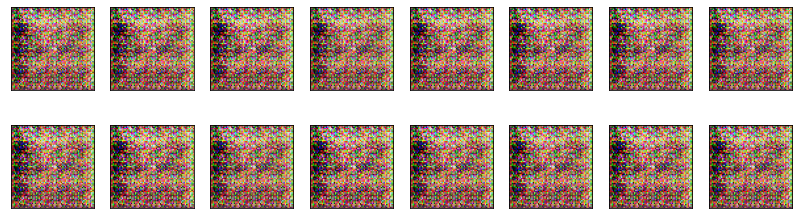

2024-05-11 19:09:09 | Epoch [2/50] | Batch 0/509 | d_loss: 1.0186 | g_loss: 2.3799
2024-05-11 19:09:12 | Epoch [2/50] | Batch 50/509 | d_loss: 0.8361 | g_loss: 2.7774
2024-05-11 19:09:16 | Epoch [2/50] | Batch 100/509 | d_loss: 1.2033 | g_loss: 1.6695
2024-05-11 19:09:19 | Epoch [2/50] | Batch 150/509 | d_loss: 0.4292 | g_loss: 4.1842
2024-05-11 19:09:22 | Epoch [2/50] | Batch 200/509 | d_loss: 0.4708 | g_loss: 3.2504
2024-05-11 19:09:26 | Epoch [2/50] | Batch 250/509 | d_loss: 0.8058 | g_loss: 2.6298
2024-05-11 19:09:29 | Epoch [2/50] | Batch 300/509 | d_loss: 2.2419 | g_loss: 1.3446
2024-05-11 19:09:33 | Epoch [2/50] | Batch 350/509 | d_loss: 1.5093 | g_loss: 1.3236
2024-05-11 19:09:36 | Epoch [2/50] | Batch 400/509 | d_loss: 1.2981 | g_loss: 1.2531
2024-05-11 19:09:39 | Epoch [2/50] | Batch 450/509 | d_loss: 1.5607 | g_loss: 0.9601
2024-05-11 19:09:43 | Epoch [2/50] | Batch 500/509 | d_loss: 1.5876 | g_loss: 1.3179


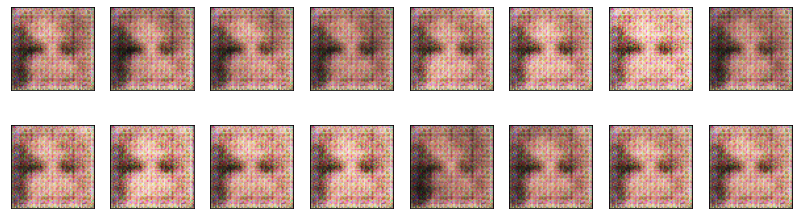

2024-05-11 19:09:47 | Epoch [3/50] | Batch 0/509 | d_loss: 1.3894 | g_loss: 1.1168
2024-05-11 19:09:50 | Epoch [3/50] | Batch 50/509 | d_loss: 1.5102 | g_loss: 0.9585
2024-05-11 19:09:54 | Epoch [3/50] | Batch 100/509 | d_loss: 1.8499 | g_loss: 1.0373
2024-05-11 19:09:57 | Epoch [3/50] | Batch 150/509 | d_loss: 1.2641 | g_loss: 1.3120
2024-05-11 19:10:01 | Epoch [3/50] | Batch 200/509 | d_loss: 1.5012 | g_loss: 1.1224
2024-05-11 19:10:04 | Epoch [3/50] | Batch 250/509 | d_loss: 1.7363 | g_loss: 0.8692
2024-05-11 19:10:07 | Epoch [3/50] | Batch 300/509 | d_loss: 1.5876 | g_loss: 0.7970
2024-05-11 19:10:11 | Epoch [3/50] | Batch 350/509 | d_loss: 1.7911 | g_loss: 0.7072
2024-05-11 19:10:14 | Epoch [3/50] | Batch 400/509 | d_loss: 1.4646 | g_loss: 1.1444
2024-05-11 19:10:17 | Epoch [3/50] | Batch 450/509 | d_loss: 1.7488 | g_loss: 0.9014
2024-05-11 19:10:21 | Epoch [3/50] | Batch 500/509 | d_loss: 1.7734 | g_loss: 1.0755


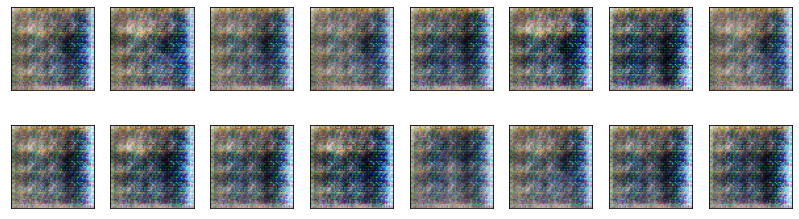

2024-05-11 19:10:26 | Epoch [4/50] | Batch 0/509 | d_loss: 0.7914 | g_loss: 2.6340
2024-05-11 19:10:29 | Epoch [4/50] | Batch 50/509 | d_loss: 1.4518 | g_loss: 1.1146
2024-05-11 19:10:33 | Epoch [4/50] | Batch 100/509 | d_loss: 1.6297 | g_loss: 1.0087
2024-05-11 19:10:36 | Epoch [4/50] | Batch 150/509 | d_loss: 1.5299 | g_loss: 0.8537
2024-05-11 19:10:40 | Epoch [4/50] | Batch 200/509 | d_loss: 1.5054 | g_loss: 0.9213
2024-05-11 19:10:43 | Epoch [4/50] | Batch 250/509 | d_loss: 1.3937 | g_loss: 1.0605
2024-05-11 19:10:46 | Epoch [4/50] | Batch 300/509 | d_loss: 1.4808 | g_loss: 0.8404
2024-05-11 19:10:50 | Epoch [4/50] | Batch 350/509 | d_loss: 1.4782 | g_loss: 1.0588
2024-05-11 19:10:53 | Epoch [4/50] | Batch 400/509 | d_loss: 2.0215 | g_loss: 1.0310
2024-05-11 19:10:56 | Epoch [4/50] | Batch 450/509 | d_loss: 1.3786 | g_loss: 1.2596
2024-05-11 19:11:00 | Epoch [4/50] | Batch 500/509 | d_loss: 1.4967 | g_loss: 0.9726


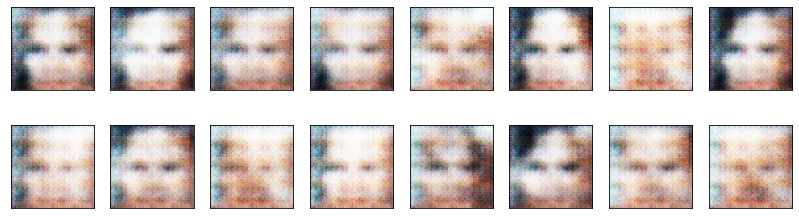

2024-05-11 19:11:04 | Epoch [5/50] | Batch 0/509 | d_loss: 1.5717 | g_loss: 0.7696
2024-05-11 19:11:07 | Epoch [5/50] | Batch 50/509 | d_loss: 1.4367 | g_loss: 0.8887
2024-05-11 19:11:11 | Epoch [5/50] | Batch 100/509 | d_loss: 1.4543 | g_loss: 0.8123
2024-05-11 19:11:14 | Epoch [5/50] | Batch 150/509 | d_loss: 1.4692 | g_loss: 0.9183
2024-05-11 19:11:18 | Epoch [5/50] | Batch 200/509 | d_loss: 1.5397 | g_loss: 0.8082
2024-05-11 19:11:22 | Epoch [5/50] | Batch 250/509 | d_loss: 1.4489 | g_loss: 0.8776
2024-05-11 19:11:26 | Epoch [5/50] | Batch 300/509 | d_loss: 1.4217 | g_loss: 0.8469
2024-05-11 19:11:29 | Epoch [5/50] | Batch 350/509 | d_loss: 1.4392 | g_loss: 0.8748
2024-05-11 19:11:32 | Epoch [5/50] | Batch 400/509 | d_loss: 1.4503 | g_loss: 0.8545
2024-05-11 19:11:36 | Epoch [5/50] | Batch 450/509 | d_loss: 1.4588 | g_loss: 0.8640
2024-05-11 19:11:39 | Epoch [5/50] | Batch 500/509 | d_loss: 1.4954 | g_loss: 0.7872


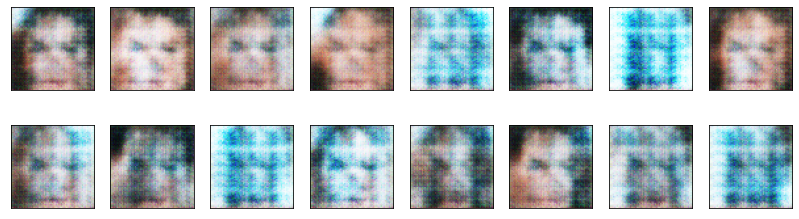

2024-05-11 19:11:43 | Epoch [6/50] | Batch 0/509 | d_loss: 1.4170 | g_loss: 0.8621
2024-05-11 19:11:47 | Epoch [6/50] | Batch 50/509 | d_loss: 1.4719 | g_loss: 0.7895
2024-05-11 19:11:50 | Epoch [6/50] | Batch 100/509 | d_loss: 1.4784 | g_loss: 0.8676
2024-05-11 19:11:54 | Epoch [6/50] | Batch 150/509 | d_loss: 1.4770 | g_loss: 0.8182
2024-05-11 19:11:57 | Epoch [6/50] | Batch 200/509 | d_loss: 1.4393 | g_loss: 0.8550
2024-05-11 19:12:01 | Epoch [6/50] | Batch 250/509 | d_loss: 1.5255 | g_loss: 0.8395
2024-05-11 19:12:04 | Epoch [6/50] | Batch 300/509 | d_loss: 1.3667 | g_loss: 0.9505
2024-05-11 19:12:07 | Epoch [6/50] | Batch 350/509 | d_loss: 1.4688 | g_loss: 0.7864
2024-05-11 19:12:11 | Epoch [6/50] | Batch 400/509 | d_loss: 1.4206 | g_loss: 0.8769
2024-05-11 19:12:14 | Epoch [6/50] | Batch 450/509 | d_loss: 1.4430 | g_loss: 0.8322
2024-05-11 19:12:17 | Epoch [6/50] | Batch 500/509 | d_loss: 1.4214 | g_loss: 0.8790


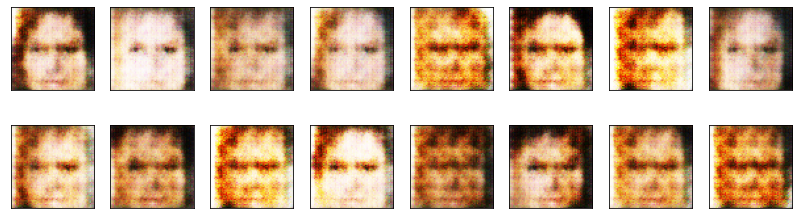

2024-05-11 19:12:22 | Epoch [7/50] | Batch 0/509 | d_loss: 1.3983 | g_loss: 0.9045
2024-05-11 19:12:26 | Epoch [7/50] | Batch 50/509 | d_loss: 1.3789 | g_loss: 0.8980
2024-05-11 19:12:29 | Epoch [7/50] | Batch 100/509 | d_loss: 1.5112 | g_loss: 0.8177
2024-05-11 19:12:33 | Epoch [7/50] | Batch 150/509 | d_loss: 1.4984 | g_loss: 0.8379
2024-05-11 19:12:36 | Epoch [7/50] | Batch 200/509 | d_loss: 1.4019 | g_loss: 0.7917
2024-05-11 19:12:40 | Epoch [7/50] | Batch 250/509 | d_loss: 1.4039 | g_loss: 0.8177
2024-05-11 19:12:43 | Epoch [7/50] | Batch 300/509 | d_loss: 1.4018 | g_loss: 0.8116
2024-05-11 19:12:46 | Epoch [7/50] | Batch 350/509 | d_loss: 1.4142 | g_loss: 0.8153
2024-05-11 19:12:50 | Epoch [7/50] | Batch 400/509 | d_loss: 1.4226 | g_loss: 0.8023
2024-05-11 19:12:53 | Epoch [7/50] | Batch 450/509 | d_loss: 1.4043 | g_loss: 0.8065
2024-05-11 19:12:56 | Epoch [7/50] | Batch 500/509 | d_loss: 1.3835 | g_loss: 0.8638


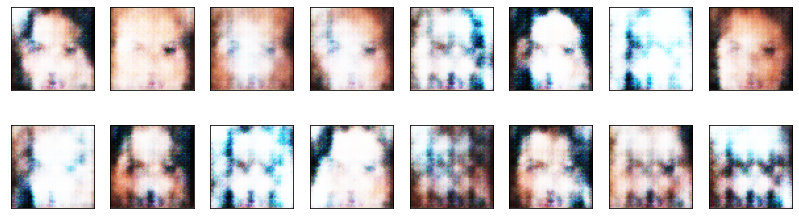

2024-05-11 19:13:01 | Epoch [8/50] | Batch 0/509 | d_loss: 1.4198 | g_loss: 0.8137
2024-05-11 19:13:05 | Epoch [8/50] | Batch 50/509 | d_loss: 1.3917 | g_loss: 0.8312
2024-05-11 19:13:08 | Epoch [8/50] | Batch 100/509 | d_loss: 1.4764 | g_loss: 0.8244
2024-05-11 19:13:11 | Epoch [8/50] | Batch 150/509 | d_loss: 1.4350 | g_loss: 0.7640
2024-05-11 19:13:15 | Epoch [8/50] | Batch 200/509 | d_loss: 1.4861 | g_loss: 0.7487
2024-05-11 19:13:18 | Epoch [8/50] | Batch 250/509 | d_loss: 1.4071 | g_loss: 0.8340
2024-05-11 19:13:22 | Epoch [8/50] | Batch 300/509 | d_loss: 1.4480 | g_loss: 0.8094
2024-05-11 19:13:25 | Epoch [8/50] | Batch 350/509 | d_loss: 1.3737 | g_loss: 0.8254
2024-05-11 19:13:29 | Epoch [8/50] | Batch 400/509 | d_loss: 1.5034 | g_loss: 0.7804
2024-05-11 19:13:32 | Epoch [8/50] | Batch 450/509 | d_loss: 1.4423 | g_loss: 0.8195
2024-05-11 19:13:35 | Epoch [8/50] | Batch 500/509 | d_loss: 1.4041 | g_loss: 0.8259


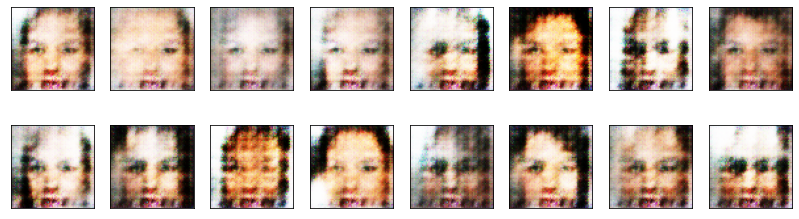

2024-05-11 19:13:40 | Epoch [9/50] | Batch 0/509 | d_loss: 1.3884 | g_loss: 0.8839
2024-05-11 19:13:43 | Epoch [9/50] | Batch 50/509 | d_loss: 1.3853 | g_loss: 0.8565
2024-05-11 19:13:47 | Epoch [9/50] | Batch 100/509 | d_loss: 1.4347 | g_loss: 0.8647
2024-05-11 19:13:50 | Epoch [9/50] | Batch 150/509 | d_loss: 1.3983 | g_loss: 0.7616
2024-05-11 19:13:54 | Epoch [9/50] | Batch 200/509 | d_loss: 1.4058 | g_loss: 0.8673
2024-05-11 19:13:57 | Epoch [9/50] | Batch 250/509 | d_loss: 1.3924 | g_loss: 0.8839
2024-05-11 19:14:00 | Epoch [9/50] | Batch 300/509 | d_loss: 1.4014 | g_loss: 0.8249
2024-05-11 19:14:04 | Epoch [9/50] | Batch 350/509 | d_loss: 1.3726 | g_loss: 0.7968
2024-05-11 19:14:07 | Epoch [9/50] | Batch 400/509 | d_loss: 1.4031 | g_loss: 0.8212
2024-05-11 19:14:11 | Epoch [9/50] | Batch 450/509 | d_loss: 1.4465 | g_loss: 0.8017
2024-05-11 19:14:14 | Epoch [9/50] | Batch 500/509 | d_loss: 1.4094 | g_loss: 0.8396


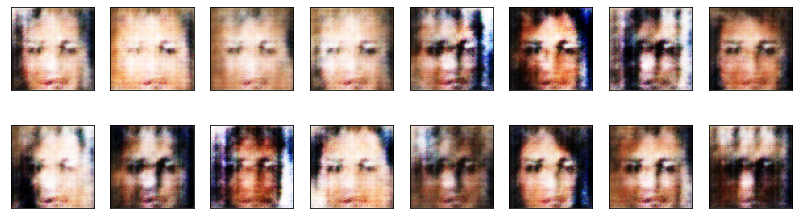

2024-05-11 19:14:18 | Epoch [10/50] | Batch 0/509 | d_loss: 1.4292 | g_loss: 0.8008
2024-05-11 19:14:21 | Epoch [10/50] | Batch 50/509 | d_loss: 1.4218 | g_loss: 0.7967
2024-05-11 19:14:25 | Epoch [10/50] | Batch 100/509 | d_loss: 1.3982 | g_loss: 0.7692
2024-05-11 19:14:28 | Epoch [10/50] | Batch 150/509 | d_loss: 1.4169 | g_loss: 0.8220
2024-05-11 19:14:32 | Epoch [10/50] | Batch 200/509 | d_loss: 1.3736 | g_loss: 0.8180
2024-05-11 19:14:35 | Epoch [10/50] | Batch 250/509 | d_loss: 1.4097 | g_loss: 0.8496
2024-05-11 19:14:38 | Epoch [10/50] | Batch 300/509 | d_loss: 1.4245 | g_loss: 0.7644
2024-05-11 19:14:42 | Epoch [10/50] | Batch 350/509 | d_loss: 1.4371 | g_loss: 0.8044
2024-05-11 19:14:45 | Epoch [10/50] | Batch 400/509 | d_loss: 1.4533 | g_loss: 0.7831
2024-05-11 19:14:48 | Epoch [10/50] | Batch 450/509 | d_loss: 1.4011 | g_loss: 0.8153
2024-05-11 19:14:52 | Epoch [10/50] | Batch 500/509 | d_loss: 1.4689 | g_loss: 0.8474


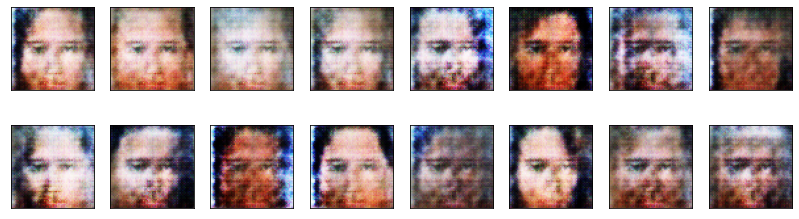

2024-05-11 19:14:55 | Epoch [11/50] | Batch 0/509 | d_loss: 1.3897 | g_loss: 0.8651
2024-05-11 19:14:59 | Epoch [11/50] | Batch 50/509 | d_loss: 1.4335 | g_loss: 0.8211
2024-05-11 19:15:03 | Epoch [11/50] | Batch 100/509 | d_loss: 1.4041 | g_loss: 0.7864
2024-05-11 19:15:06 | Epoch [11/50] | Batch 150/509 | d_loss: 1.4130 | g_loss: 0.8450
2024-05-11 19:15:10 | Epoch [11/50] | Batch 200/509 | d_loss: 1.4089 | g_loss: 0.7902
2024-05-11 19:15:13 | Epoch [11/50] | Batch 250/509 | d_loss: 1.3880 | g_loss: 0.7889
2024-05-11 19:15:17 | Epoch [11/50] | Batch 300/509 | d_loss: 1.4499 | g_loss: 0.7826
2024-05-11 19:15:20 | Epoch [11/50] | Batch 350/509 | d_loss: 1.4197 | g_loss: 0.8217
2024-05-11 19:15:23 | Epoch [11/50] | Batch 400/509 | d_loss: 1.4380 | g_loss: 0.8157
2024-05-11 19:15:27 | Epoch [11/50] | Batch 450/509 | d_loss: 1.4039 | g_loss: 0.8415
2024-05-11 19:15:30 | Epoch [11/50] | Batch 500/509 | d_loss: 1.4510 | g_loss: 0.7777


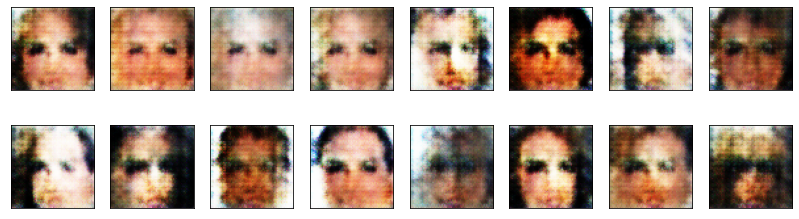

2024-05-11 19:15:34 | Epoch [12/50] | Batch 0/509 | d_loss: 1.3766 | g_loss: 0.8077
2024-05-11 19:15:38 | Epoch [12/50] | Batch 50/509 | d_loss: 1.3823 | g_loss: 0.7852
2024-05-11 19:15:41 | Epoch [12/50] | Batch 100/509 | d_loss: 1.4251 | g_loss: 0.7753
2024-05-11 19:15:45 | Epoch [12/50] | Batch 150/509 | d_loss: 1.3856 | g_loss: 0.8024
2024-05-11 19:15:48 | Epoch [12/50] | Batch 200/509 | d_loss: 1.3796 | g_loss: 0.8328
2024-05-11 19:15:52 | Epoch [12/50] | Batch 250/509 | d_loss: 1.4346 | g_loss: 0.7676
2024-05-11 19:15:55 | Epoch [12/50] | Batch 300/509 | d_loss: 1.3829 | g_loss: 0.8058
2024-05-11 19:15:58 | Epoch [12/50] | Batch 350/509 | d_loss: 1.4624 | g_loss: 0.7465
2024-05-11 19:16:02 | Epoch [12/50] | Batch 400/509 | d_loss: 1.4356 | g_loss: 0.7709
2024-05-11 19:16:05 | Epoch [12/50] | Batch 450/509 | d_loss: 1.3875 | g_loss: 0.7751
2024-05-11 19:16:08 | Epoch [12/50] | Batch 500/509 | d_loss: 1.4440 | g_loss: 0.7863


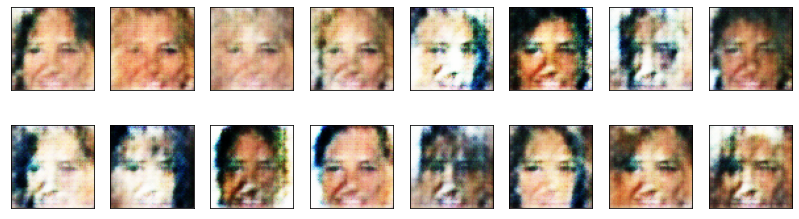

2024-05-11 19:16:12 | Epoch [13/50] | Batch 0/509 | d_loss: 1.3987 | g_loss: 0.8120
2024-05-11 19:16:15 | Epoch [13/50] | Batch 50/509 | d_loss: 1.4513 | g_loss: 0.8123
2024-05-11 19:16:19 | Epoch [13/50] | Batch 100/509 | d_loss: 1.4188 | g_loss: 0.8040
2024-05-11 19:16:22 | Epoch [13/50] | Batch 150/509 | d_loss: 1.4412 | g_loss: 0.7341
2024-05-11 19:16:25 | Epoch [13/50] | Batch 200/509 | d_loss: 1.3929 | g_loss: 0.8151
2024-05-11 19:16:29 | Epoch [13/50] | Batch 250/509 | d_loss: 1.3725 | g_loss: 0.8350
2024-05-11 19:16:32 | Epoch [13/50] | Batch 300/509 | d_loss: 1.3902 | g_loss: 0.7926
2024-05-11 19:16:36 | Epoch [13/50] | Batch 350/509 | d_loss: 1.4347 | g_loss: 0.8044
2024-05-11 19:16:39 | Epoch [13/50] | Batch 400/509 | d_loss: 1.4665 | g_loss: 0.7737
2024-05-11 19:16:42 | Epoch [13/50] | Batch 450/509 | d_loss: 1.3933 | g_loss: 0.7623
2024-05-11 19:16:46 | Epoch [13/50] | Batch 500/509 | d_loss: 1.4182 | g_loss: 0.7755


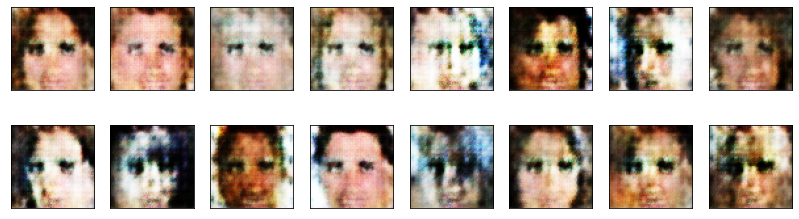

2024-05-11 19:16:51 | Epoch [14/50] | Batch 0/509 | d_loss: 1.3995 | g_loss: 0.8223
2024-05-11 19:16:54 | Epoch [14/50] | Batch 50/509 | d_loss: 1.3841 | g_loss: 0.8176
2024-05-11 19:16:58 | Epoch [14/50] | Batch 100/509 | d_loss: 1.4297 | g_loss: 0.8551
2024-05-11 19:17:01 | Epoch [14/50] | Batch 150/509 | d_loss: 1.4301 | g_loss: 0.8323
2024-05-11 19:17:04 | Epoch [14/50] | Batch 200/509 | d_loss: 1.3977 | g_loss: 0.8038
2024-05-11 19:17:08 | Epoch [14/50] | Batch 250/509 | d_loss: 1.3932 | g_loss: 0.8144
2024-05-11 19:17:11 | Epoch [14/50] | Batch 300/509 | d_loss: 1.4035 | g_loss: 0.8008
2024-05-11 19:17:15 | Epoch [14/50] | Batch 350/509 | d_loss: 1.4079 | g_loss: 0.7924
2024-05-11 19:17:18 | Epoch [14/50] | Batch 400/509 | d_loss: 1.3922 | g_loss: 0.8324
2024-05-11 19:17:21 | Epoch [14/50] | Batch 450/509 | d_loss: 1.4148 | g_loss: 0.8011
2024-05-11 19:17:25 | Epoch [14/50] | Batch 500/509 | d_loss: 1.3862 | g_loss: 0.7948


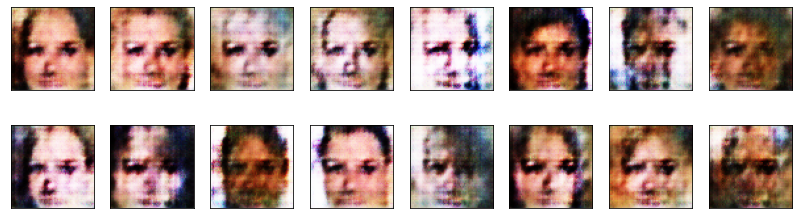

2024-05-11 19:17:29 | Epoch [15/50] | Batch 0/509 | d_loss: 1.3928 | g_loss: 0.7881
2024-05-11 19:17:33 | Epoch [15/50] | Batch 50/509 | d_loss: 1.3896 | g_loss: 0.7888
2024-05-11 19:17:36 | Epoch [15/50] | Batch 100/509 | d_loss: 1.4232 | g_loss: 0.8021
2024-05-11 19:17:40 | Epoch [15/50] | Batch 150/509 | d_loss: 1.4010 | g_loss: 0.8115
2024-05-11 19:17:43 | Epoch [15/50] | Batch 200/509 | d_loss: 1.4390 | g_loss: 0.7990
2024-05-11 19:17:46 | Epoch [15/50] | Batch 250/509 | d_loss: 1.4252 | g_loss: 0.7984
2024-05-11 19:17:50 | Epoch [15/50] | Batch 300/509 | d_loss: 1.3862 | g_loss: 0.7416
2024-05-11 19:17:53 | Epoch [15/50] | Batch 350/509 | d_loss: 1.3899 | g_loss: 0.8112
2024-05-11 19:17:57 | Epoch [15/50] | Batch 400/509 | d_loss: 1.4087 | g_loss: 0.7844
2024-05-11 19:18:00 | Epoch [15/50] | Batch 450/509 | d_loss: 1.4300 | g_loss: 0.7821
2024-05-11 19:18:03 | Epoch [15/50] | Batch 500/509 | d_loss: 1.3945 | g_loss: 0.7820


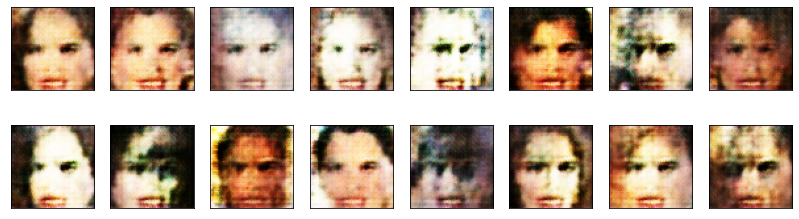

2024-05-11 19:18:08 | Epoch [16/50] | Batch 0/509 | d_loss: 1.4027 | g_loss: 0.8169
2024-05-11 19:18:11 | Epoch [16/50] | Batch 50/509 | d_loss: 1.4188 | g_loss: 0.7884
2024-05-11 19:18:15 | Epoch [16/50] | Batch 100/509 | d_loss: 1.3830 | g_loss: 0.7609
2024-05-11 19:18:18 | Epoch [16/50] | Batch 150/509 | d_loss: 1.4180 | g_loss: 0.8032
2024-05-11 19:18:22 | Epoch [16/50] | Batch 200/509 | d_loss: 1.4071 | g_loss: 0.7862
2024-05-11 19:18:25 | Epoch [16/50] | Batch 250/509 | d_loss: 1.3827 | g_loss: 0.7892
2024-05-11 19:18:29 | Epoch [16/50] | Batch 300/509 | d_loss: 1.4349 | g_loss: 0.7698
2024-05-11 19:18:32 | Epoch [16/50] | Batch 350/509 | d_loss: 1.3836 | g_loss: 0.7963
2024-05-11 19:18:35 | Epoch [16/50] | Batch 400/509 | d_loss: 1.3934 | g_loss: 0.8178
2024-05-11 19:18:39 | Epoch [16/50] | Batch 450/509 | d_loss: 1.4122 | g_loss: 0.8290
2024-05-11 19:18:42 | Epoch [16/50] | Batch 500/509 | d_loss: 1.3801 | g_loss: 0.7487


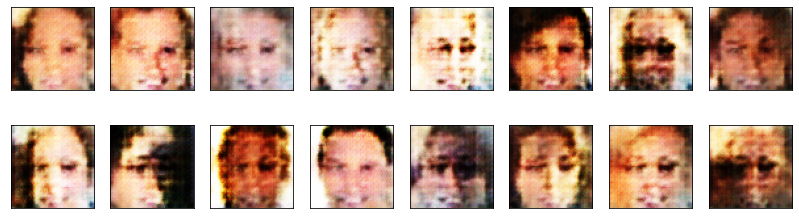

2024-05-11 19:18:46 | Epoch [17/50] | Batch 0/509 | d_loss: 1.3866 | g_loss: 0.7945
2024-05-11 19:18:50 | Epoch [17/50] | Batch 50/509 | d_loss: 1.3888 | g_loss: 0.8307
2024-05-11 19:18:53 | Epoch [17/50] | Batch 100/509 | d_loss: 1.3891 | g_loss: 0.8102
2024-05-11 19:18:57 | Epoch [17/50] | Batch 150/509 | d_loss: 1.4041 | g_loss: 0.7714
2024-05-11 19:19:00 | Epoch [17/50] | Batch 200/509 | d_loss: 1.3982 | g_loss: 0.7578
2024-05-11 19:19:04 | Epoch [17/50] | Batch 250/509 | d_loss: 1.3665 | g_loss: 0.7846
2024-05-11 19:19:07 | Epoch [17/50] | Batch 300/509 | d_loss: 1.4100 | g_loss: 0.7946
2024-05-11 19:19:10 | Epoch [17/50] | Batch 350/509 | d_loss: 1.4123 | g_loss: 0.8238
2024-05-11 19:19:14 | Epoch [17/50] | Batch 400/509 | d_loss: 1.3999 | g_loss: 0.8134
2024-05-11 19:19:17 | Epoch [17/50] | Batch 450/509 | d_loss: 1.3675 | g_loss: 0.7711
2024-05-11 19:19:20 | Epoch [17/50] | Batch 500/509 | d_loss: 1.3937 | g_loss: 0.8191


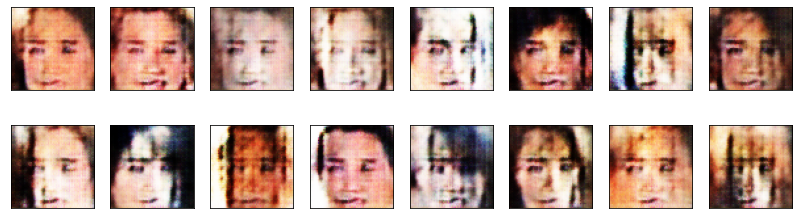

2024-05-11 19:19:26 | Epoch [18/50] | Batch 0/509 | d_loss: 1.3875 | g_loss: 0.7900
2024-05-11 19:19:29 | Epoch [18/50] | Batch 50/509 | d_loss: 1.4116 | g_loss: 0.7732
2024-05-11 19:19:33 | Epoch [18/50] | Batch 100/509 | d_loss: 1.3909 | g_loss: 0.7878
2024-05-11 19:19:37 | Epoch [18/50] | Batch 150/509 | d_loss: 1.4061 | g_loss: 0.7834
2024-05-11 19:19:40 | Epoch [18/50] | Batch 200/509 | d_loss: 1.4054 | g_loss: 0.7788
2024-05-11 19:19:43 | Epoch [18/50] | Batch 250/509 | d_loss: 1.3752 | g_loss: 0.8448
2024-05-11 19:19:47 | Epoch [18/50] | Batch 300/509 | d_loss: 1.4027 | g_loss: 0.7926
2024-05-11 19:19:50 | Epoch [18/50] | Batch 350/509 | d_loss: 1.3930 | g_loss: 0.7781
2024-05-11 19:19:54 | Epoch [18/50] | Batch 400/509 | d_loss: 1.4314 | g_loss: 0.7924
2024-05-11 19:19:58 | Epoch [18/50] | Batch 450/509 | d_loss: 1.3877 | g_loss: 0.7792
2024-05-11 19:20:01 | Epoch [18/50] | Batch 500/509 | d_loss: 1.4094 | g_loss: 0.7687


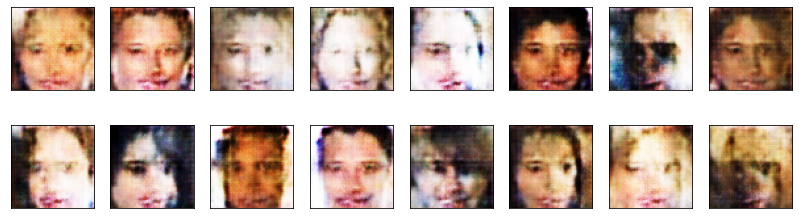

2024-05-11 19:20:06 | Epoch [19/50] | Batch 0/509 | d_loss: 1.3862 | g_loss: 0.7846
2024-05-11 19:20:10 | Epoch [19/50] | Batch 50/509 | d_loss: 1.3805 | g_loss: 0.7601
2024-05-11 19:20:13 | Epoch [19/50] | Batch 100/509 | d_loss: 1.4051 | g_loss: 0.7800
2024-05-11 19:20:17 | Epoch [19/50] | Batch 150/509 | d_loss: 1.3919 | g_loss: 0.7756
2024-05-11 19:20:20 | Epoch [19/50] | Batch 200/509 | d_loss: 1.3751 | g_loss: 0.7957
2024-05-11 19:20:24 | Epoch [19/50] | Batch 250/509 | d_loss: 1.3954 | g_loss: 0.7822
2024-05-11 19:20:27 | Epoch [19/50] | Batch 300/509 | d_loss: 1.3993 | g_loss: 0.7857
2024-05-11 19:20:31 | Epoch [19/50] | Batch 350/509 | d_loss: 1.3952 | g_loss: 0.8350
2024-05-11 19:20:34 | Epoch [19/50] | Batch 400/509 | d_loss: 1.4024 | g_loss: 0.7814
2024-05-11 19:20:37 | Epoch [19/50] | Batch 450/509 | d_loss: 1.3924 | g_loss: 0.8022
2024-05-11 19:20:41 | Epoch [19/50] | Batch 500/509 | d_loss: 1.3923 | g_loss: 0.8355


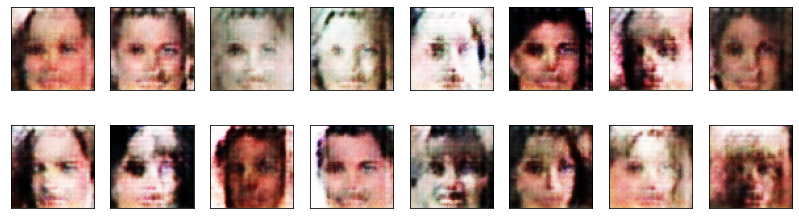

2024-05-11 19:20:45 | Epoch [20/50] | Batch 0/509 | d_loss: 1.4010 | g_loss: 0.7692
2024-05-11 19:20:49 | Epoch [20/50] | Batch 50/509 | d_loss: 1.3673 | g_loss: 0.8449
2024-05-11 19:20:52 | Epoch [20/50] | Batch 100/509 | d_loss: 1.4058 | g_loss: 0.7806
2024-05-11 19:20:56 | Epoch [20/50] | Batch 150/509 | d_loss: 1.4083 | g_loss: 0.7684
2024-05-11 19:20:59 | Epoch [20/50] | Batch 200/509 | d_loss: 1.3653 | g_loss: 0.7652
2024-05-11 19:21:03 | Epoch [20/50] | Batch 250/509 | d_loss: 1.3990 | g_loss: 0.7415
2024-05-11 19:21:06 | Epoch [20/50] | Batch 300/509 | d_loss: 1.3812 | g_loss: 0.8241
2024-05-11 19:21:09 | Epoch [20/50] | Batch 350/509 | d_loss: 1.3870 | g_loss: 0.7899
2024-05-11 19:21:13 | Epoch [20/50] | Batch 400/509 | d_loss: 1.3897 | g_loss: 0.7921
2024-05-11 19:21:16 | Epoch [20/50] | Batch 450/509 | d_loss: 1.4049 | g_loss: 0.7885
2024-05-11 19:21:20 | Epoch [20/50] | Batch 500/509 | d_loss: 1.3844 | g_loss: 0.8099


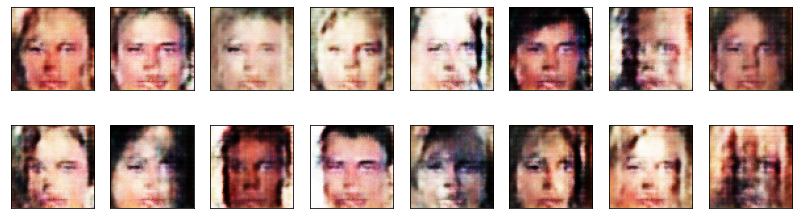

2024-05-11 19:21:25 | Epoch [21/50] | Batch 0/509 | d_loss: 1.3820 | g_loss: 0.8217
2024-05-11 19:21:28 | Epoch [21/50] | Batch 50/509 | d_loss: 1.4112 | g_loss: 0.8112
2024-05-11 19:21:32 | Epoch [21/50] | Batch 100/509 | d_loss: 1.3936 | g_loss: 0.8111
2024-05-11 19:21:35 | Epoch [21/50] | Batch 150/509 | d_loss: 1.3865 | g_loss: 0.8062
2024-05-11 19:21:39 | Epoch [21/50] | Batch 200/509 | d_loss: 1.4050 | g_loss: 0.7732
2024-05-11 19:21:42 | Epoch [21/50] | Batch 250/509 | d_loss: 1.4002 | g_loss: 0.7741
2024-05-11 19:21:45 | Epoch [21/50] | Batch 300/509 | d_loss: 1.4079 | g_loss: 0.7848
2024-05-11 19:21:49 | Epoch [21/50] | Batch 350/509 | d_loss: 1.3881 | g_loss: 0.8020
2024-05-11 19:21:52 | Epoch [21/50] | Batch 400/509 | d_loss: 1.4151 | g_loss: 0.7843
2024-05-11 19:21:55 | Epoch [21/50] | Batch 450/509 | d_loss: 1.3544 | g_loss: 0.7823
2024-05-11 19:21:59 | Epoch [21/50] | Batch 500/509 | d_loss: 1.4000 | g_loss: 0.7669


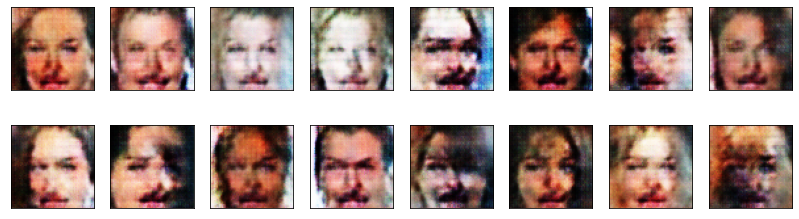

2024-05-11 19:22:03 | Epoch [22/50] | Batch 0/509 | d_loss: 1.3829 | g_loss: 0.7817
2024-05-11 19:22:07 | Epoch [22/50] | Batch 50/509 | d_loss: 1.3828 | g_loss: 0.7955
2024-05-11 19:22:11 | Epoch [22/50] | Batch 100/509 | d_loss: 1.4050 | g_loss: 0.7515
2024-05-11 19:22:14 | Epoch [22/50] | Batch 150/509 | d_loss: 1.3648 | g_loss: 0.8223
2024-05-11 19:22:18 | Epoch [22/50] | Batch 200/509 | d_loss: 1.3912 | g_loss: 0.7833
2024-05-11 19:22:21 | Epoch [22/50] | Batch 250/509 | d_loss: 1.3968 | g_loss: 0.8261
2024-05-11 19:22:24 | Epoch [22/50] | Batch 300/509 | d_loss: 1.3790 | g_loss: 0.7895
2024-05-11 19:22:28 | Epoch [22/50] | Batch 350/509 | d_loss: 1.3901 | g_loss: 0.7689
2024-05-11 19:22:31 | Epoch [22/50] | Batch 400/509 | d_loss: 1.3829 | g_loss: 0.7859
2024-05-11 19:22:35 | Epoch [22/50] | Batch 450/509 | d_loss: 1.3702 | g_loss: 0.7632
2024-05-11 19:22:38 | Epoch [22/50] | Batch 500/509 | d_loss: 1.3842 | g_loss: 0.8044


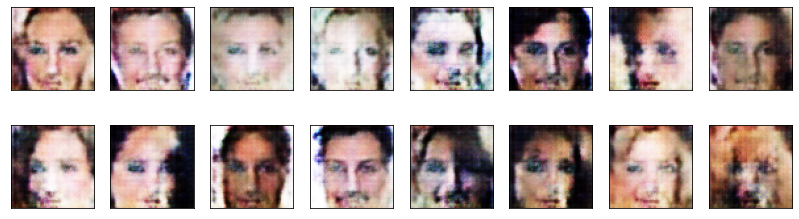

2024-05-11 19:22:43 | Epoch [23/50] | Batch 0/509 | d_loss: 1.3815 | g_loss: 0.7944
2024-05-11 19:22:46 | Epoch [23/50] | Batch 50/509 | d_loss: 1.3857 | g_loss: 0.8227
2024-05-11 19:22:50 | Epoch [23/50] | Batch 100/509 | d_loss: 1.4040 | g_loss: 0.7584
2024-05-11 19:22:54 | Epoch [23/50] | Batch 150/509 | d_loss: 1.3728 | g_loss: 0.8010
2024-05-11 19:22:57 | Epoch [23/50] | Batch 200/509 | d_loss: 1.3910 | g_loss: 0.7827
2024-05-11 19:23:01 | Epoch [23/50] | Batch 250/509 | d_loss: 1.3657 | g_loss: 0.8097
2024-05-11 19:23:05 | Epoch [23/50] | Batch 300/509 | d_loss: 1.3713 | g_loss: 0.8272
2024-05-11 19:23:08 | Epoch [23/50] | Batch 350/509 | d_loss: 1.3906 | g_loss: 0.8075
2024-05-11 19:23:12 | Epoch [23/50] | Batch 400/509 | d_loss: 1.3823 | g_loss: 0.8094
2024-05-11 19:23:16 | Epoch [23/50] | Batch 450/509 | d_loss: 1.3637 | g_loss: 0.7780
2024-05-11 19:23:19 | Epoch [23/50] | Batch 500/509 | d_loss: 1.4027 | g_loss: 0.8308


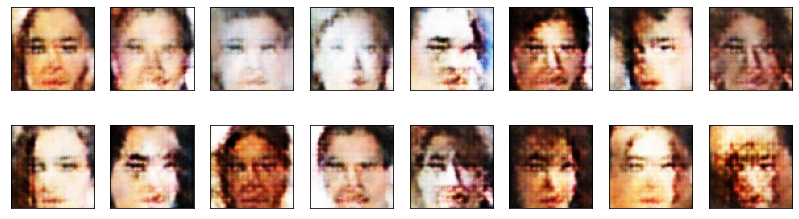

2024-05-11 19:23:24 | Epoch [24/50] | Batch 0/509 | d_loss: 1.4093 | g_loss: 0.7831
2024-05-11 19:23:27 | Epoch [24/50] | Batch 50/509 | d_loss: 1.3797 | g_loss: 0.8084
2024-05-11 19:23:31 | Epoch [24/50] | Batch 100/509 | d_loss: 1.3877 | g_loss: 0.8276
2024-05-11 19:23:34 | Epoch [24/50] | Batch 150/509 | d_loss: 1.3911 | g_loss: 0.7804
2024-05-11 19:23:38 | Epoch [24/50] | Batch 200/509 | d_loss: 1.3834 | g_loss: 0.8084
2024-05-11 19:23:41 | Epoch [24/50] | Batch 250/509 | d_loss: 1.3679 | g_loss: 0.8081
2024-05-11 19:23:45 | Epoch [24/50] | Batch 300/509 | d_loss: 1.3857 | g_loss: 0.8356
2024-05-11 19:23:48 | Epoch [24/50] | Batch 350/509 | d_loss: 1.3754 | g_loss: 0.7923
2024-05-11 19:23:51 | Epoch [24/50] | Batch 400/509 | d_loss: 1.3743 | g_loss: 0.7784
2024-05-11 19:23:55 | Epoch [24/50] | Batch 450/509 | d_loss: 1.3997 | g_loss: 0.7555
2024-05-11 19:23:58 | Epoch [24/50] | Batch 500/509 | d_loss: 1.3743 | g_loss: 0.7746


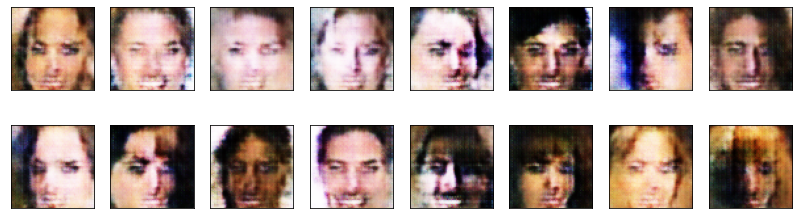

2024-05-11 19:24:03 | Epoch [25/50] | Batch 0/509 | d_loss: 1.3837 | g_loss: 0.7860
2024-05-11 19:24:06 | Epoch [25/50] | Batch 50/509 | d_loss: 1.3820 | g_loss: 0.7975
2024-05-11 19:24:10 | Epoch [25/50] | Batch 100/509 | d_loss: 1.3835 | g_loss: 0.7913
2024-05-11 19:24:13 | Epoch [25/50] | Batch 150/509 | d_loss: 1.4243 | g_loss: 0.7666
2024-05-11 19:24:17 | Epoch [25/50] | Batch 200/509 | d_loss: 1.3882 | g_loss: 0.8162
2024-05-11 19:24:20 | Epoch [25/50] | Batch 250/509 | d_loss: 1.3667 | g_loss: 0.8403
2024-05-11 19:24:23 | Epoch [25/50] | Batch 300/509 | d_loss: 1.3946 | g_loss: 0.7839
2024-05-11 19:24:27 | Epoch [25/50] | Batch 350/509 | d_loss: 1.3781 | g_loss: 0.8088
2024-05-11 19:24:30 | Epoch [25/50] | Batch 400/509 | d_loss: 1.3710 | g_loss: 0.7672
2024-05-11 19:24:34 | Epoch [25/50] | Batch 450/509 | d_loss: 1.4095 | g_loss: 0.7902
2024-05-11 19:24:37 | Epoch [25/50] | Batch 500/509 | d_loss: 1.3667 | g_loss: 0.7995


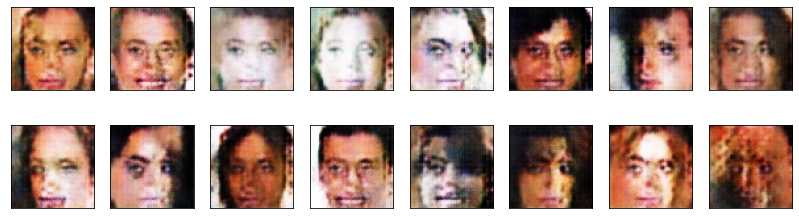

2024-05-11 19:24:42 | Epoch [26/50] | Batch 0/509 | d_loss: 1.3629 | g_loss: 0.7753
2024-05-11 19:24:46 | Epoch [26/50] | Batch 50/509 | d_loss: 1.3907 | g_loss: 0.7533
2024-05-11 19:24:50 | Epoch [26/50] | Batch 100/509 | d_loss: 1.3824 | g_loss: 0.7780
2024-05-11 19:24:53 | Epoch [26/50] | Batch 150/509 | d_loss: 1.3721 | g_loss: 0.8002
2024-05-11 19:24:57 | Epoch [26/50] | Batch 200/509 | d_loss: 1.4085 | g_loss: 0.7641
2024-05-11 19:25:00 | Epoch [26/50] | Batch 250/509 | d_loss: 1.4001 | g_loss: 0.8247
2024-05-11 19:25:04 | Epoch [26/50] | Batch 300/509 | d_loss: 1.3810 | g_loss: 0.7972
2024-05-11 19:25:07 | Epoch [26/50] | Batch 350/509 | d_loss: 1.4062 | g_loss: 0.7862
2024-05-11 19:25:11 | Epoch [26/50] | Batch 400/509 | d_loss: 1.3707 | g_loss: 0.8297
2024-05-11 19:25:15 | Epoch [26/50] | Batch 450/509 | d_loss: 1.3739 | g_loss: 0.8116
2024-05-11 19:25:18 | Epoch [26/50] | Batch 500/509 | d_loss: 1.4015 | g_loss: 0.7875


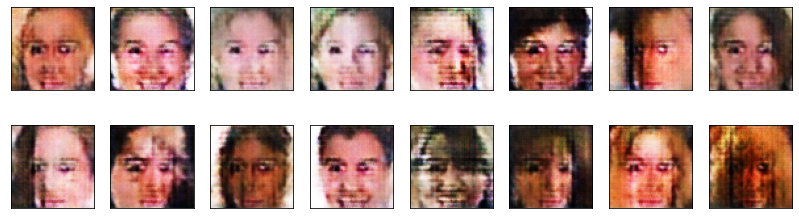

2024-05-11 19:25:23 | Epoch [27/50] | Batch 0/509 | d_loss: 1.4040 | g_loss: 0.7860
2024-05-11 19:25:27 | Epoch [27/50] | Batch 50/509 | d_loss: 1.3761 | g_loss: 0.7937
2024-05-11 19:25:30 | Epoch [27/50] | Batch 100/509 | d_loss: 1.4004 | g_loss: 0.7683
2024-05-11 19:25:34 | Epoch [27/50] | Batch 150/509 | d_loss: 1.4207 | g_loss: 0.8291
2024-05-11 19:25:37 | Epoch [27/50] | Batch 200/509 | d_loss: 1.3901 | g_loss: 0.8165
2024-05-11 19:25:41 | Epoch [27/50] | Batch 250/509 | d_loss: 1.3929 | g_loss: 0.7637
2024-05-11 19:25:44 | Epoch [27/50] | Batch 300/509 | d_loss: 1.3829 | g_loss: 0.7872
2024-05-11 19:25:48 | Epoch [27/50] | Batch 350/509 | d_loss: 1.3969 | g_loss: 0.7828
2024-05-11 19:25:51 | Epoch [27/50] | Batch 400/509 | d_loss: 1.3919 | g_loss: 0.7815
2024-05-11 19:25:54 | Epoch [27/50] | Batch 450/509 | d_loss: 1.4020 | g_loss: 0.7749
2024-05-11 19:25:58 | Epoch [27/50] | Batch 500/509 | d_loss: 1.3899 | g_loss: 0.7480


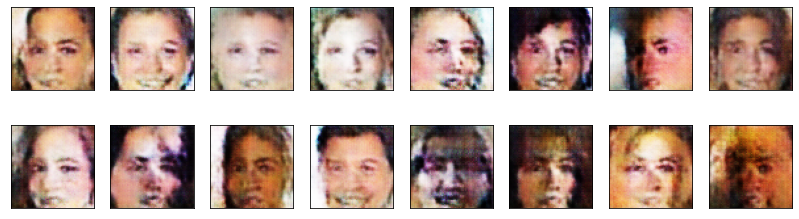

2024-05-11 19:26:03 | Epoch [28/50] | Batch 0/509 | d_loss: 1.3636 | g_loss: 0.8367
2024-05-11 19:26:07 | Epoch [28/50] | Batch 50/509 | d_loss: 1.3541 | g_loss: 0.8048
2024-05-11 19:26:10 | Epoch [28/50] | Batch 100/509 | d_loss: 1.3856 | g_loss: 0.7711
2024-05-11 19:26:14 | Epoch [28/50] | Batch 150/509 | d_loss: 1.3684 | g_loss: 0.8112
2024-05-11 19:26:17 | Epoch [28/50] | Batch 200/509 | d_loss: 1.3946 | g_loss: 0.7908
2024-05-11 19:26:21 | Epoch [28/50] | Batch 250/509 | d_loss: 1.3821 | g_loss: 0.8232
2024-05-11 19:26:24 | Epoch [28/50] | Batch 300/509 | d_loss: 1.4058 | g_loss: 0.8118
2024-05-11 19:26:28 | Epoch [28/50] | Batch 350/509 | d_loss: 1.3836 | g_loss: 0.7710
2024-05-11 19:26:32 | Epoch [28/50] | Batch 400/509 | d_loss: 1.4028 | g_loss: 0.7846
2024-05-11 19:26:35 | Epoch [28/50] | Batch 450/509 | d_loss: 1.4128 | g_loss: 0.7271
2024-05-11 19:26:39 | Epoch [28/50] | Batch 500/509 | d_loss: 1.3885 | g_loss: 0.7957


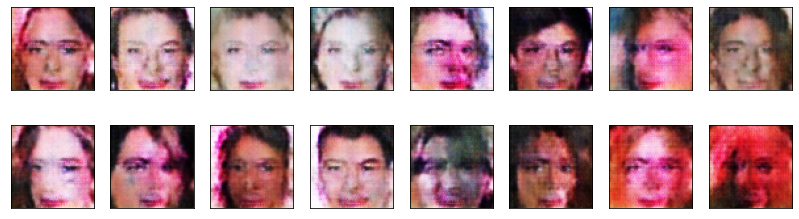

2024-05-11 19:26:43 | Epoch [29/50] | Batch 0/509 | d_loss: 1.3574 | g_loss: 0.7909
2024-05-11 19:26:46 | Epoch [29/50] | Batch 50/509 | d_loss: 1.3683 | g_loss: 0.8162
2024-05-11 19:26:50 | Epoch [29/50] | Batch 100/509 | d_loss: 1.3885 | g_loss: 0.8200
2024-05-11 19:26:53 | Epoch [29/50] | Batch 150/509 | d_loss: 1.3969 | g_loss: 0.7920
2024-05-11 19:26:57 | Epoch [29/50] | Batch 200/509 | d_loss: 1.3793 | g_loss: 0.7894
2024-05-11 19:27:00 | Epoch [29/50] | Batch 250/509 | d_loss: 1.3812 | g_loss: 0.8333
2024-05-11 19:27:03 | Epoch [29/50] | Batch 300/509 | d_loss: 1.3849 | g_loss: 0.7917
2024-05-11 19:27:07 | Epoch [29/50] | Batch 350/509 | d_loss: 1.4023 | g_loss: 0.8019
2024-05-11 19:27:10 | Epoch [29/50] | Batch 400/509 | d_loss: 1.3867 | g_loss: 0.7595
2024-05-11 19:27:14 | Epoch [29/50] | Batch 450/509 | d_loss: 1.3769 | g_loss: 0.8077
2024-05-11 19:27:17 | Epoch [29/50] | Batch 500/509 | d_loss: 1.3924 | g_loss: 0.7859


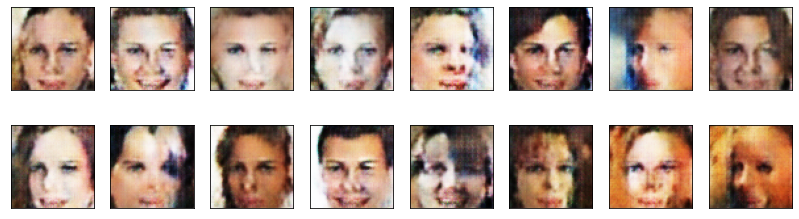

2024-05-11 19:27:23 | Epoch [30/50] | Batch 0/509 | d_loss: 1.3810 | g_loss: 0.8209
2024-05-11 19:27:26 | Epoch [30/50] | Batch 50/509 | d_loss: 1.3835 | g_loss: 0.7879
2024-05-11 19:27:30 | Epoch [30/50] | Batch 100/509 | d_loss: 1.3960 | g_loss: 0.8297
2024-05-11 19:27:33 | Epoch [30/50] | Batch 150/509 | d_loss: 1.3938 | g_loss: 0.7569
2024-05-11 19:27:37 | Epoch [30/50] | Batch 200/509 | d_loss: 1.3716 | g_loss: 0.7675
2024-05-11 19:27:40 | Epoch [30/50] | Batch 250/509 | d_loss: 1.3789 | g_loss: 0.8142
2024-05-11 19:27:44 | Epoch [30/50] | Batch 300/509 | d_loss: 1.3789 | g_loss: 0.8236
2024-05-11 19:27:47 | Epoch [30/50] | Batch 350/509 | d_loss: 1.3915 | g_loss: 0.8103
2024-05-11 19:27:51 | Epoch [30/50] | Batch 400/509 | d_loss: 1.4182 | g_loss: 0.7990
2024-05-11 19:27:55 | Epoch [30/50] | Batch 450/509 | d_loss: 1.3774 | g_loss: 0.8359
2024-05-11 19:27:58 | Epoch [30/50] | Batch 500/509 | d_loss: 1.3898 | g_loss: 0.8110


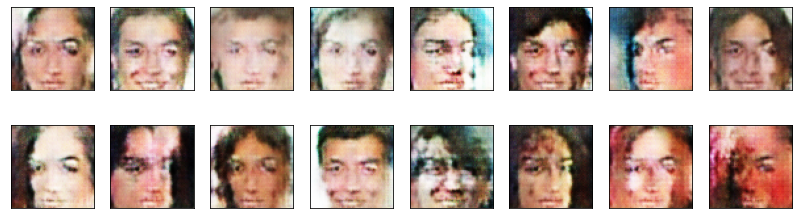

2024-05-11 19:28:04 | Epoch [31/50] | Batch 0/509 | d_loss: 1.4131 | g_loss: 0.8031
2024-05-11 19:28:07 | Epoch [31/50] | Batch 50/509 | d_loss: 1.3828 | g_loss: 0.7900
2024-05-11 19:28:11 | Epoch [31/50] | Batch 100/509 | d_loss: 1.3858 | g_loss: 0.7793
2024-05-11 19:28:14 | Epoch [31/50] | Batch 150/509 | d_loss: 1.3774 | g_loss: 0.8165
2024-05-11 19:28:18 | Epoch [31/50] | Batch 200/509 | d_loss: 1.3870 | g_loss: 0.7928
2024-05-11 19:28:21 | Epoch [31/50] | Batch 250/509 | d_loss: 1.3940 | g_loss: 0.8065
2024-05-11 19:28:25 | Epoch [31/50] | Batch 300/509 | d_loss: 1.4186 | g_loss: 0.8595
2024-05-11 19:28:28 | Epoch [31/50] | Batch 350/509 | d_loss: 1.3752 | g_loss: 0.8045
2024-05-11 19:28:32 | Epoch [31/50] | Batch 400/509 | d_loss: 1.3807 | g_loss: 0.8216
2024-05-11 19:28:35 | Epoch [31/50] | Batch 450/509 | d_loss: 1.3696 | g_loss: 0.7891
2024-05-11 19:28:38 | Epoch [31/50] | Batch 500/509 | d_loss: 1.3942 | g_loss: 0.7802


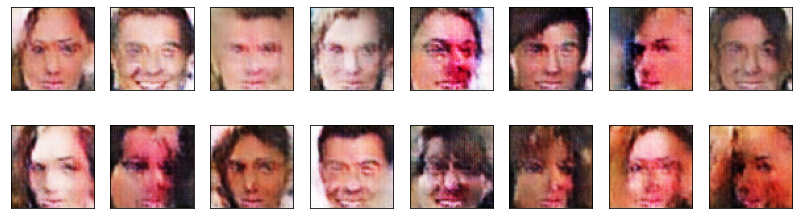

2024-05-11 19:28:42 | Epoch [32/50] | Batch 0/509 | d_loss: 1.3868 | g_loss: 0.7979
2024-05-11 19:28:46 | Epoch [32/50] | Batch 50/509 | d_loss: 1.4000 | g_loss: 0.7777
2024-05-11 19:28:49 | Epoch [32/50] | Batch 100/509 | d_loss: 1.3981 | g_loss: 0.7818
2024-05-11 19:28:53 | Epoch [32/50] | Batch 150/509 | d_loss: 1.3838 | g_loss: 0.7995
2024-05-11 19:28:56 | Epoch [32/50] | Batch 200/509 | d_loss: 1.3750 | g_loss: 0.8619
2024-05-11 19:29:00 | Epoch [32/50] | Batch 250/509 | d_loss: 1.4034 | g_loss: 0.7763
2024-05-11 19:29:03 | Epoch [32/50] | Batch 300/509 | d_loss: 1.3830 | g_loss: 0.8132
2024-05-11 19:29:07 | Epoch [32/50] | Batch 350/509 | d_loss: 1.3800 | g_loss: 0.8358
2024-05-11 19:29:10 | Epoch [32/50] | Batch 400/509 | d_loss: 1.3928 | g_loss: 0.8246
2024-05-11 19:29:14 | Epoch [32/50] | Batch 450/509 | d_loss: 1.3839 | g_loss: 0.8001
2024-05-11 19:29:17 | Epoch [32/50] | Batch 500/509 | d_loss: 1.3806 | g_loss: 0.7742


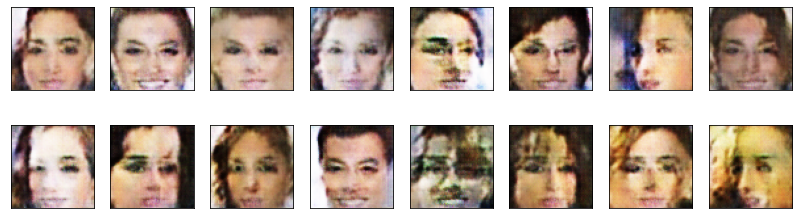

2024-05-11 19:29:21 | Epoch [33/50] | Batch 0/509 | d_loss: 1.3724 | g_loss: 0.7839
2024-05-11 19:29:25 | Epoch [33/50] | Batch 50/509 | d_loss: 1.3902 | g_loss: 0.8186
2024-05-11 19:29:29 | Epoch [33/50] | Batch 100/509 | d_loss: 1.3704 | g_loss: 0.8048
2024-05-11 19:29:32 | Epoch [33/50] | Batch 150/509 | d_loss: 1.3822 | g_loss: 0.7831
2024-05-11 19:29:35 | Epoch [33/50] | Batch 200/509 | d_loss: 1.3882 | g_loss: 0.8011
2024-05-11 19:29:39 | Epoch [33/50] | Batch 250/509 | d_loss: 1.4049 | g_loss: 0.8201
2024-05-11 19:29:42 | Epoch [33/50] | Batch 300/509 | d_loss: 1.3934 | g_loss: 0.7966
2024-05-11 19:29:46 | Epoch [33/50] | Batch 350/509 | d_loss: 1.3889 | g_loss: 0.8291
2024-05-11 19:29:49 | Epoch [33/50] | Batch 400/509 | d_loss: 1.3818 | g_loss: 0.7963
2024-05-11 19:29:52 | Epoch [33/50] | Batch 450/509 | d_loss: 1.3905 | g_loss: 0.7726
2024-05-11 19:29:56 | Epoch [33/50] | Batch 500/509 | d_loss: 1.3641 | g_loss: 0.8239


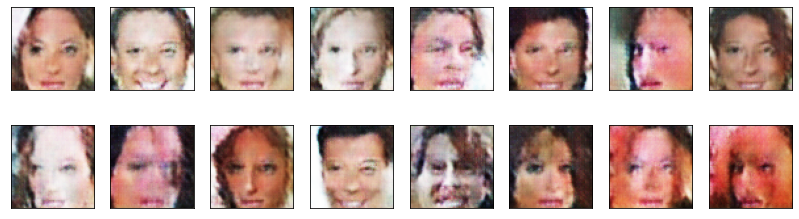

2024-05-11 19:30:00 | Epoch [34/50] | Batch 0/509 | d_loss: 1.4121 | g_loss: 0.8497
2024-05-11 19:30:03 | Epoch [34/50] | Batch 50/509 | d_loss: 1.3863 | g_loss: 0.7834
2024-05-11 19:30:07 | Epoch [34/50] | Batch 100/509 | d_loss: 1.3847 | g_loss: 0.7940
2024-05-11 19:30:11 | Epoch [34/50] | Batch 150/509 | d_loss: 1.4093 | g_loss: 0.8036
2024-05-11 19:30:14 | Epoch [34/50] | Batch 200/509 | d_loss: 1.3867 | g_loss: 0.8067
2024-05-11 19:30:18 | Epoch [34/50] | Batch 250/509 | d_loss: 1.3818 | g_loss: 0.7870
2024-05-11 19:30:21 | Epoch [34/50] | Batch 300/509 | d_loss: 1.3989 | g_loss: 0.8206
2024-05-11 19:30:25 | Epoch [34/50] | Batch 350/509 | d_loss: 1.3777 | g_loss: 0.8030
2024-05-11 19:30:28 | Epoch [34/50] | Batch 400/509 | d_loss: 1.3903 | g_loss: 0.7939
2024-05-11 19:30:32 | Epoch [34/50] | Batch 450/509 | d_loss: 1.4059 | g_loss: 0.8018
2024-05-11 19:30:35 | Epoch [34/50] | Batch 500/509 | d_loss: 1.3840 | g_loss: 0.8115


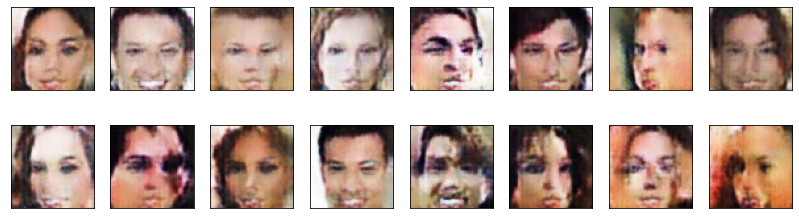

2024-05-11 19:30:39 | Epoch [35/50] | Batch 0/509 | d_loss: 1.3710 | g_loss: 0.8098
2024-05-11 19:30:43 | Epoch [35/50] | Batch 50/509 | d_loss: 1.4014 | g_loss: 0.8190
2024-05-11 19:30:46 | Epoch [35/50] | Batch 100/509 | d_loss: 1.3731 | g_loss: 0.8038
2024-05-11 19:30:50 | Epoch [35/50] | Batch 150/509 | d_loss: 1.3975 | g_loss: 0.7943
2024-05-11 19:30:53 | Epoch [35/50] | Batch 200/509 | d_loss: 1.4115 | g_loss: 0.7978
2024-05-11 19:30:57 | Epoch [35/50] | Batch 250/509 | d_loss: 1.3695 | g_loss: 0.7885
2024-05-11 19:31:00 | Epoch [35/50] | Batch 300/509 | d_loss: 1.4059 | g_loss: 0.7785
2024-05-11 19:31:03 | Epoch [35/50] | Batch 350/509 | d_loss: 1.3912 | g_loss: 0.7832
2024-05-11 19:31:07 | Epoch [35/50] | Batch 400/509 | d_loss: 1.3724 | g_loss: 0.8124
2024-05-11 19:31:10 | Epoch [35/50] | Batch 450/509 | d_loss: 1.3772 | g_loss: 0.8165
2024-05-11 19:31:14 | Epoch [35/50] | Batch 500/509 | d_loss: 1.4066 | g_loss: 0.8278


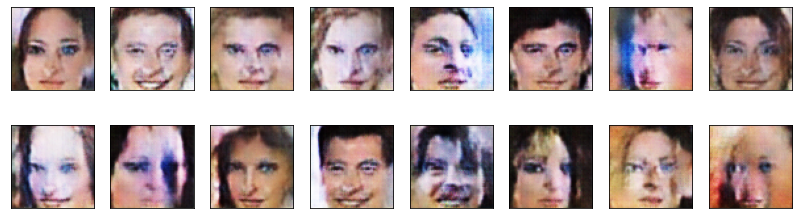

2024-05-11 19:31:18 | Epoch [36/50] | Batch 0/509 | d_loss: 1.3738 | g_loss: 0.8281
2024-05-11 19:31:22 | Epoch [36/50] | Batch 50/509 | d_loss: 1.3902 | g_loss: 0.7766
2024-05-11 19:31:25 | Epoch [36/50] | Batch 100/509 | d_loss: 1.3678 | g_loss: 0.8044
2024-05-11 19:31:29 | Epoch [36/50] | Batch 150/509 | d_loss: 1.3715 | g_loss: 0.7751
2024-05-11 19:31:32 | Epoch [36/50] | Batch 200/509 | d_loss: 1.3857 | g_loss: 0.8457
2024-05-11 19:31:36 | Epoch [36/50] | Batch 250/509 | d_loss: 1.3801 | g_loss: 0.7587
2024-05-11 19:31:39 | Epoch [36/50] | Batch 300/509 | d_loss: 1.3570 | g_loss: 0.8053
2024-05-11 19:31:43 | Epoch [36/50] | Batch 350/509 | d_loss: 1.3690 | g_loss: 0.7839
2024-05-11 19:31:46 | Epoch [36/50] | Batch 400/509 | d_loss: 1.3740 | g_loss: 0.7918
2024-05-11 19:31:49 | Epoch [36/50] | Batch 450/509 | d_loss: 1.3695 | g_loss: 0.7780
2024-05-11 19:31:53 | Epoch [36/50] | Batch 500/509 | d_loss: 1.3516 | g_loss: 0.7805


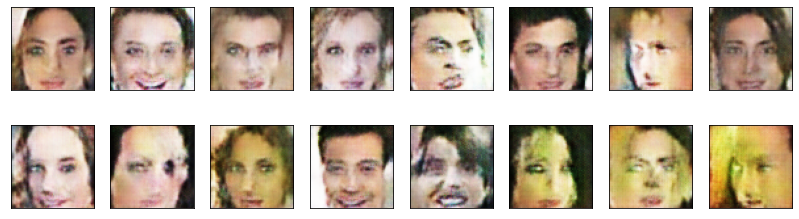

2024-05-11 19:31:57 | Epoch [37/50] | Batch 0/509 | d_loss: 1.3840 | g_loss: 0.8216
2024-05-11 19:32:01 | Epoch [37/50] | Batch 50/509 | d_loss: 1.3783 | g_loss: 0.7858
2024-05-11 19:32:05 | Epoch [37/50] | Batch 100/509 | d_loss: 1.3823 | g_loss: 0.7993
2024-05-11 19:32:08 | Epoch [37/50] | Batch 150/509 | d_loss: 1.3850 | g_loss: 0.8038
2024-05-11 19:32:11 | Epoch [37/50] | Batch 200/509 | d_loss: 1.3990 | g_loss: 0.8059
2024-05-11 19:32:15 | Epoch [37/50] | Batch 250/509 | d_loss: 1.3783 | g_loss: 0.8096
2024-05-11 19:32:18 | Epoch [37/50] | Batch 300/509 | d_loss: 1.4020 | g_loss: 0.8260
2024-05-11 19:32:22 | Epoch [37/50] | Batch 350/509 | d_loss: 1.3891 | g_loss: 0.7847
2024-05-11 19:32:25 | Epoch [37/50] | Batch 400/509 | d_loss: 1.4028 | g_loss: 0.7950
2024-05-11 19:32:28 | Epoch [37/50] | Batch 450/509 | d_loss: 1.3729 | g_loss: 0.8271
2024-05-11 19:32:32 | Epoch [37/50] | Batch 500/509 | d_loss: 1.3594 | g_loss: 0.8036


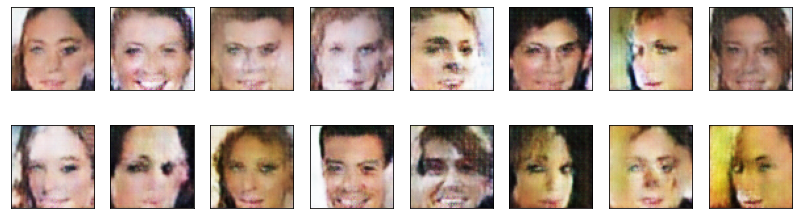

2024-05-11 19:32:36 | Epoch [38/50] | Batch 0/509 | d_loss: 1.3589 | g_loss: 0.8130
2024-05-11 19:32:40 | Epoch [38/50] | Batch 50/509 | d_loss: 1.3684 | g_loss: 0.8169
2024-05-11 19:32:43 | Epoch [38/50] | Batch 100/509 | d_loss: 1.3881 | g_loss: 0.8020
2024-05-11 19:32:47 | Epoch [38/50] | Batch 150/509 | d_loss: 1.3763 | g_loss: 0.8573
2024-05-11 19:32:50 | Epoch [38/50] | Batch 200/509 | d_loss: 1.3785 | g_loss: 0.8178
2024-05-11 19:32:54 | Epoch [38/50] | Batch 250/509 | d_loss: 1.3907 | g_loss: 0.7975
2024-05-11 19:32:57 | Epoch [38/50] | Batch 300/509 | d_loss: 1.3804 | g_loss: 0.7964
2024-05-11 19:33:00 | Epoch [38/50] | Batch 350/509 | d_loss: 1.3543 | g_loss: 0.8313
2024-05-11 19:33:04 | Epoch [38/50] | Batch 400/509 | d_loss: 1.3804 | g_loss: 0.7690
2024-05-11 19:33:07 | Epoch [38/50] | Batch 450/509 | d_loss: 1.3783 | g_loss: 0.8077
2024-05-11 19:33:11 | Epoch [38/50] | Batch 500/509 | d_loss: 1.3935 | g_loss: 0.8091


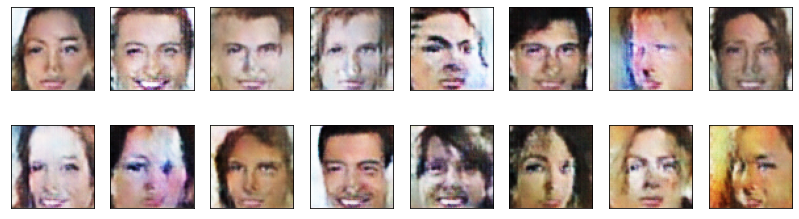

2024-05-11 19:33:15 | Epoch [39/50] | Batch 0/509 | d_loss: 1.3509 | g_loss: 0.8421
2024-05-11 19:33:19 | Epoch [39/50] | Batch 50/509 | d_loss: 1.4061 | g_loss: 0.8429
2024-05-11 19:33:23 | Epoch [39/50] | Batch 100/509 | d_loss: 1.3766 | g_loss: 0.7762
2024-05-11 19:33:26 | Epoch [39/50] | Batch 150/509 | d_loss: 1.4036 | g_loss: 0.8014
2024-05-11 19:33:29 | Epoch [39/50] | Batch 200/509 | d_loss: 1.3573 | g_loss: 0.8421
2024-05-11 19:33:33 | Epoch [39/50] | Batch 250/509 | d_loss: 1.3763 | g_loss: 0.8034
2024-05-11 19:33:36 | Epoch [39/50] | Batch 300/509 | d_loss: 1.3960 | g_loss: 0.7779
2024-05-11 19:33:40 | Epoch [39/50] | Batch 350/509 | d_loss: 1.3796 | g_loss: 0.8319
2024-05-11 19:33:43 | Epoch [39/50] | Batch 400/509 | d_loss: 1.3699 | g_loss: 0.8063
2024-05-11 19:33:46 | Epoch [39/50] | Batch 450/509 | d_loss: 1.3813 | g_loss: 0.7781
2024-05-11 19:33:50 | Epoch [39/50] | Batch 500/509 | d_loss: 1.3890 | g_loss: 0.7998


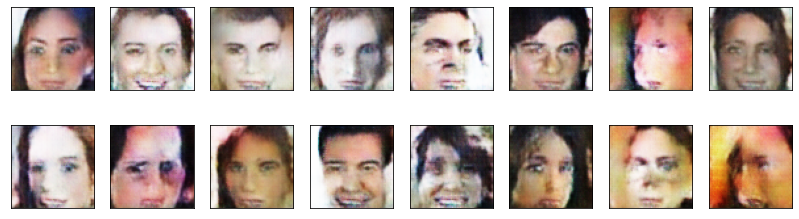

2024-05-11 19:33:55 | Epoch [40/50] | Batch 0/509 | d_loss: 1.3742 | g_loss: 0.8193
2024-05-11 19:33:59 | Epoch [40/50] | Batch 50/509 | d_loss: 1.3793 | g_loss: 0.8089
2024-05-11 19:34:02 | Epoch [40/50] | Batch 100/509 | d_loss: 1.3851 | g_loss: 0.7923
2024-05-11 19:34:06 | Epoch [40/50] | Batch 150/509 | d_loss: 1.3857 | g_loss: 0.7789
2024-05-11 19:34:09 | Epoch [40/50] | Batch 200/509 | d_loss: 1.3876 | g_loss: 0.8275
2024-05-11 19:34:12 | Epoch [40/50] | Batch 250/509 | d_loss: 1.3687 | g_loss: 0.8117
2024-05-11 19:34:16 | Epoch [40/50] | Batch 300/509 | d_loss: 1.3672 | g_loss: 0.8102
2024-05-11 19:34:19 | Epoch [40/50] | Batch 350/509 | d_loss: 1.3830 | g_loss: 0.8118
2024-05-11 19:34:22 | Epoch [40/50] | Batch 400/509 | d_loss: 1.3755 | g_loss: 0.7905
2024-05-11 19:34:26 | Epoch [40/50] | Batch 450/509 | d_loss: 1.4006 | g_loss: 0.7836
2024-05-11 19:34:29 | Epoch [40/50] | Batch 500/509 | d_loss: 1.3797 | g_loss: 0.8455


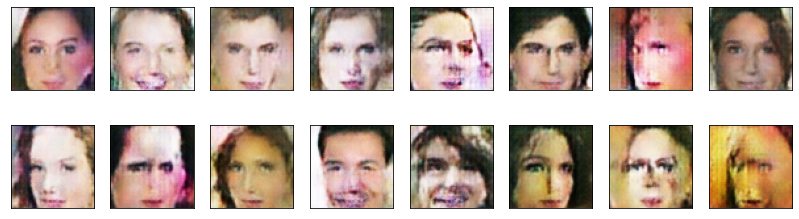

2024-05-11 19:34:34 | Epoch [41/50] | Batch 0/509 | d_loss: 1.3611 | g_loss: 0.7971
2024-05-11 19:34:37 | Epoch [41/50] | Batch 50/509 | d_loss: 1.4029 | g_loss: 0.8391
2024-05-11 19:34:41 | Epoch [41/50] | Batch 100/509 | d_loss: 1.3834 | g_loss: 0.8028
2024-05-11 19:34:45 | Epoch [41/50] | Batch 150/509 | d_loss: 1.3876 | g_loss: 0.8117
2024-05-11 19:34:48 | Epoch [41/50] | Batch 200/509 | d_loss: 1.3820 | g_loss: 0.8004
2024-05-11 19:34:52 | Epoch [41/50] | Batch 250/509 | d_loss: 1.3824 | g_loss: 0.8074
2024-05-11 19:34:56 | Epoch [41/50] | Batch 300/509 | d_loss: 1.3629 | g_loss: 0.8254
2024-05-11 19:34:59 | Epoch [41/50] | Batch 350/509 | d_loss: 1.4190 | g_loss: 0.8129
2024-05-11 19:35:03 | Epoch [41/50] | Batch 400/509 | d_loss: 1.3900 | g_loss: 0.7962
2024-05-11 19:35:06 | Epoch [41/50] | Batch 450/509 | d_loss: 1.3629 | g_loss: 0.8151
2024-05-11 19:35:10 | Epoch [41/50] | Batch 500/509 | d_loss: 1.4004 | g_loss: 0.8130


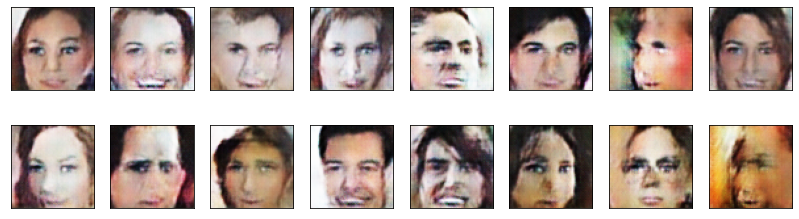

2024-05-11 19:35:16 | Epoch [42/50] | Batch 0/509 | d_loss: 1.3678 | g_loss: 0.8233
2024-05-11 19:35:20 | Epoch [42/50] | Batch 50/509 | d_loss: 1.3548 | g_loss: 0.7993
2024-05-11 19:35:24 | Epoch [42/50] | Batch 100/509 | d_loss: 1.3977 | g_loss: 0.7748
2024-05-11 19:35:27 | Epoch [42/50] | Batch 150/509 | d_loss: 1.3841 | g_loss: 0.7928
2024-05-11 19:35:30 | Epoch [42/50] | Batch 200/509 | d_loss: 1.4122 | g_loss: 0.7942
2024-05-11 19:35:34 | Epoch [42/50] | Batch 250/509 | d_loss: 1.3804 | g_loss: 0.8208
2024-05-11 19:35:37 | Epoch [42/50] | Batch 300/509 | d_loss: 1.3782 | g_loss: 0.7973
2024-05-11 19:35:41 | Epoch [42/50] | Batch 350/509 | d_loss: 1.4011 | g_loss: 0.7996
2024-05-11 19:35:44 | Epoch [42/50] | Batch 400/509 | d_loss: 1.3886 | g_loss: 0.8200
2024-05-11 19:35:48 | Epoch [42/50] | Batch 450/509 | d_loss: 1.3576 | g_loss: 0.7856
2024-05-11 19:35:51 | Epoch [42/50] | Batch 500/509 | d_loss: 1.3883 | g_loss: 0.8264


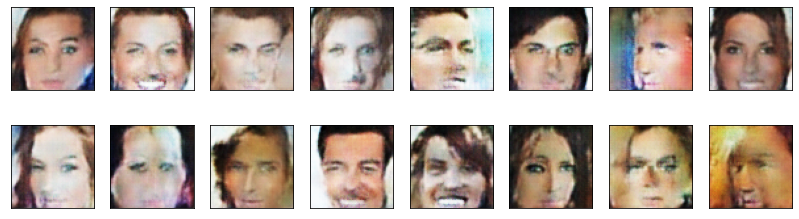

2024-05-11 19:35:56 | Epoch [43/50] | Batch 0/509 | d_loss: 1.3714 | g_loss: 0.7993
2024-05-11 19:36:00 | Epoch [43/50] | Batch 50/509 | d_loss: 1.3826 | g_loss: 0.8440
2024-05-11 19:36:04 | Epoch [43/50] | Batch 100/509 | d_loss: 1.3672 | g_loss: 0.8183
2024-05-11 19:36:07 | Epoch [43/50] | Batch 150/509 | d_loss: 1.3492 | g_loss: 0.8304
2024-05-11 19:36:11 | Epoch [43/50] | Batch 200/509 | d_loss: 1.3718 | g_loss: 0.8214
2024-05-11 19:36:15 | Epoch [43/50] | Batch 250/509 | d_loss: 1.3633 | g_loss: 0.7844
2024-05-11 19:36:19 | Epoch [43/50] | Batch 300/509 | d_loss: 1.4216 | g_loss: 0.7806
2024-05-11 19:36:22 | Epoch [43/50] | Batch 350/509 | d_loss: 1.3850 | g_loss: 0.8262
2024-05-11 19:36:26 | Epoch [43/50] | Batch 400/509 | d_loss: 1.3662 | g_loss: 0.7782
2024-05-11 19:36:29 | Epoch [43/50] | Batch 450/509 | d_loss: 1.3504 | g_loss: 0.8224
2024-05-11 19:36:32 | Epoch [43/50] | Batch 500/509 | d_loss: 1.3772 | g_loss: 0.7954


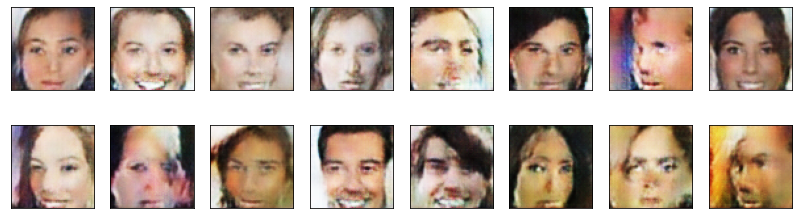

2024-05-11 19:36:37 | Epoch [44/50] | Batch 0/509 | d_loss: 1.3748 | g_loss: 0.8493
2024-05-11 19:36:41 | Epoch [44/50] | Batch 50/509 | d_loss: 1.3851 | g_loss: 0.8286
2024-05-11 19:36:44 | Epoch [44/50] | Batch 100/509 | d_loss: 1.3797 | g_loss: 0.7786
2024-05-11 19:36:48 | Epoch [44/50] | Batch 150/509 | d_loss: 1.3465 | g_loss: 0.7990
2024-05-11 19:36:51 | Epoch [44/50] | Batch 200/509 | d_loss: 1.3895 | g_loss: 0.7920
2024-05-11 19:36:54 | Epoch [44/50] | Batch 250/509 | d_loss: 1.3690 | g_loss: 0.7909
2024-05-11 19:36:58 | Epoch [44/50] | Batch 300/509 | d_loss: 1.4085 | g_loss: 0.7950
2024-05-11 19:37:01 | Epoch [44/50] | Batch 350/509 | d_loss: 1.3926 | g_loss: 0.8026
2024-05-11 19:37:04 | Epoch [44/50] | Batch 400/509 | d_loss: 1.3781 | g_loss: 0.8241
2024-05-11 19:37:08 | Epoch [44/50] | Batch 450/509 | d_loss: 1.3630 | g_loss: 0.8505
2024-05-11 19:37:11 | Epoch [44/50] | Batch 500/509 | d_loss: 1.3752 | g_loss: 0.8176


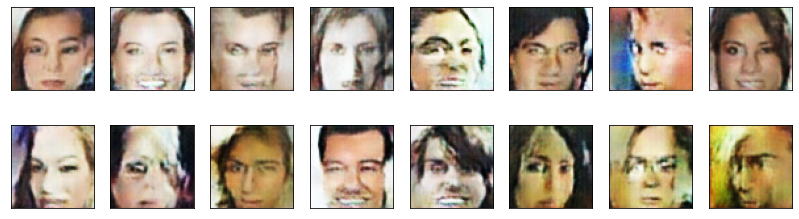

2024-05-11 19:37:16 | Epoch [45/50] | Batch 0/509 | d_loss: 1.3653 | g_loss: 0.8141
2024-05-11 19:37:20 | Epoch [45/50] | Batch 50/509 | d_loss: 1.3492 | g_loss: 0.8370
2024-05-11 19:37:24 | Epoch [45/50] | Batch 100/509 | d_loss: 1.3597 | g_loss: 0.8026
2024-05-11 19:37:28 | Epoch [45/50] | Batch 150/509 | d_loss: 1.3532 | g_loss: 0.8203
2024-05-11 19:37:31 | Epoch [45/50] | Batch 200/509 | d_loss: 1.3580 | g_loss: 0.8453
2024-05-11 19:37:35 | Epoch [45/50] | Batch 250/509 | d_loss: 1.3982 | g_loss: 0.8219
2024-05-11 19:37:38 | Epoch [45/50] | Batch 300/509 | d_loss: 1.4033 | g_loss: 0.7678
2024-05-11 19:37:42 | Epoch [45/50] | Batch 350/509 | d_loss: 1.3908 | g_loss: 0.7825
2024-05-11 19:37:45 | Epoch [45/50] | Batch 400/509 | d_loss: 1.3829 | g_loss: 0.7656
2024-05-11 19:37:48 | Epoch [45/50] | Batch 450/509 | d_loss: 1.3660 | g_loss: 0.8033
2024-05-11 19:37:52 | Epoch [45/50] | Batch 500/509 | d_loss: 1.3560 | g_loss: 0.8326


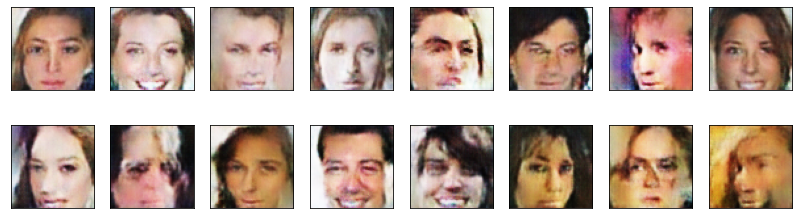

2024-05-11 19:37:55 | Epoch [46/50] | Batch 0/509 | d_loss: 1.3429 | g_loss: 0.8405
2024-05-11 19:37:59 | Epoch [46/50] | Batch 50/509 | d_loss: 1.3488 | g_loss: 0.8329
2024-05-11 19:38:03 | Epoch [46/50] | Batch 100/509 | d_loss: 1.3471 | g_loss: 0.8181
2024-05-11 19:38:06 | Epoch [46/50] | Batch 150/509 | d_loss: 1.3581 | g_loss: 0.8487
2024-05-11 19:38:09 | Epoch [46/50] | Batch 200/509 | d_loss: 1.4074 | g_loss: 0.8345
2024-05-11 19:38:13 | Epoch [46/50] | Batch 250/509 | d_loss: 1.3538 | g_loss: 0.8198
2024-05-11 19:38:16 | Epoch [46/50] | Batch 300/509 | d_loss: 1.4029 | g_loss: 0.7575
2024-05-11 19:38:20 | Epoch [46/50] | Batch 350/509 | d_loss: 1.3810 | g_loss: 0.7957
2024-05-11 19:38:23 | Epoch [46/50] | Batch 400/509 | d_loss: 1.3931 | g_loss: 0.8065
2024-05-11 19:38:26 | Epoch [46/50] | Batch 450/509 | d_loss: 1.3757 | g_loss: 0.8196
2024-05-11 19:38:30 | Epoch [46/50] | Batch 500/509 | d_loss: 1.3503 | g_loss: 0.8599


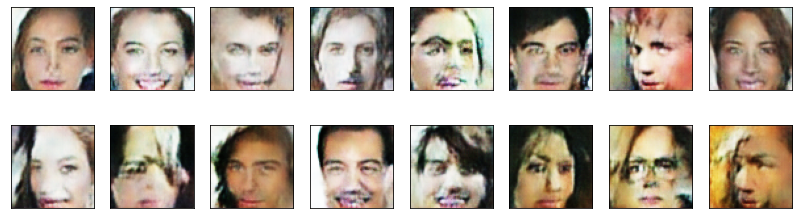

2024-05-11 19:38:35 | Epoch [47/50] | Batch 0/509 | d_loss: 1.3710 | g_loss: 0.8108
2024-05-11 19:38:38 | Epoch [47/50] | Batch 50/509 | d_loss: 1.3637 | g_loss: 0.7788
2024-05-11 19:38:42 | Epoch [47/50] | Batch 100/509 | d_loss: 1.3151 | g_loss: 0.8447
2024-05-11 19:38:45 | Epoch [47/50] | Batch 150/509 | d_loss: 1.3806 | g_loss: 0.8557
2024-05-11 19:38:49 | Epoch [47/50] | Batch 200/509 | d_loss: 1.3784 | g_loss: 0.8469
2024-05-11 19:38:52 | Epoch [47/50] | Batch 250/509 | d_loss: 1.3761 | g_loss: 0.8099
2024-05-11 19:38:55 | Epoch [47/50] | Batch 300/509 | d_loss: 1.3553 | g_loss: 0.8694
2024-05-11 19:38:59 | Epoch [47/50] | Batch 350/509 | d_loss: 1.3743 | g_loss: 0.8756
2024-05-11 19:39:02 | Epoch [47/50] | Batch 400/509 | d_loss: 1.3476 | g_loss: 0.8498
2024-05-11 19:39:05 | Epoch [47/50] | Batch 450/509 | d_loss: 1.3609 | g_loss: 0.7460
2024-05-11 19:39:09 | Epoch [47/50] | Batch 500/509 | d_loss: 1.3676 | g_loss: 0.8579


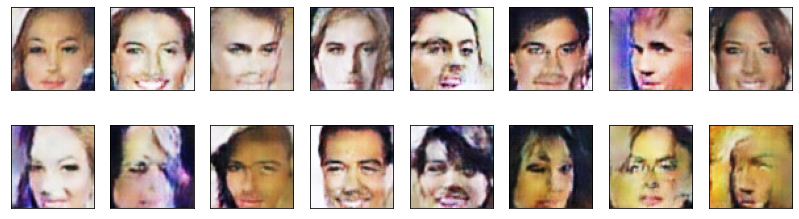

2024-05-11 19:39:13 | Epoch [48/50] | Batch 0/509 | d_loss: 1.3836 | g_loss: 0.7876
2024-05-11 19:39:16 | Epoch [48/50] | Batch 50/509 | d_loss: 1.3734 | g_loss: 0.8382
2024-05-11 19:39:20 | Epoch [48/50] | Batch 100/509 | d_loss: 1.3710 | g_loss: 0.8421
2024-05-11 19:39:23 | Epoch [48/50] | Batch 150/509 | d_loss: 1.3435 | g_loss: 0.8342
2024-05-11 19:39:26 | Epoch [48/50] | Batch 200/509 | d_loss: 1.3253 | g_loss: 0.9113
2024-05-11 19:39:30 | Epoch [48/50] | Batch 250/509 | d_loss: 1.3289 | g_loss: 0.7767
2024-05-11 19:39:33 | Epoch [48/50] | Batch 300/509 | d_loss: 1.3927 | g_loss: 0.8225
2024-05-11 19:39:37 | Epoch [48/50] | Batch 350/509 | d_loss: 1.3381 | g_loss: 0.9124
2024-05-11 19:39:40 | Epoch [48/50] | Batch 400/509 | d_loss: 1.3042 | g_loss: 0.9038
2024-05-11 19:39:43 | Epoch [48/50] | Batch 450/509 | d_loss: 1.3681 | g_loss: 0.7953
2024-05-11 19:39:47 | Epoch [48/50] | Batch 500/509 | d_loss: 1.3360 | g_loss: 0.8936


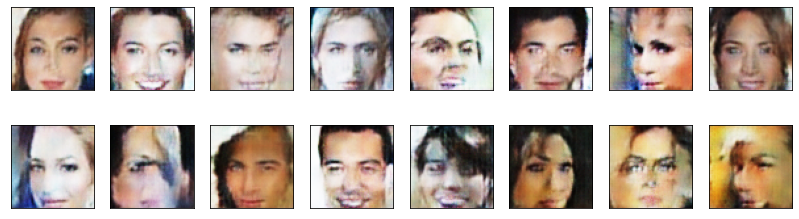

2024-05-11 19:39:52 | Epoch [49/50] | Batch 0/509 | d_loss: 1.3339 | g_loss: 0.9135
2024-05-11 19:39:56 | Epoch [49/50] | Batch 50/509 | d_loss: 1.2666 | g_loss: 0.9985
2024-05-11 19:39:59 | Epoch [49/50] | Batch 100/509 | d_loss: 1.3192 | g_loss: 0.7961
2024-05-11 19:40:02 | Epoch [49/50] | Batch 150/509 | d_loss: 1.3616 | g_loss: 0.8505
2024-05-11 19:40:06 | Epoch [49/50] | Batch 200/509 | d_loss: 1.3453 | g_loss: 0.9160
2024-05-11 19:40:09 | Epoch [49/50] | Batch 250/509 | d_loss: 1.2937 | g_loss: 0.9159
2024-05-11 19:40:13 | Epoch [49/50] | Batch 300/509 | d_loss: 1.3821 | g_loss: 0.8209
2024-05-11 19:40:16 | Epoch [49/50] | Batch 350/509 | d_loss: 1.3225 | g_loss: 0.8741
2024-05-11 19:40:20 | Epoch [49/50] | Batch 400/509 | d_loss: 1.3165 | g_loss: 0.8542
2024-05-11 19:40:23 | Epoch [49/50] | Batch 450/509 | d_loss: 1.3055 | g_loss: 0.8703
2024-05-11 19:40:27 | Epoch [49/50] | Batch 500/509 | d_loss: 1.3664 | g_loss: 0.8214


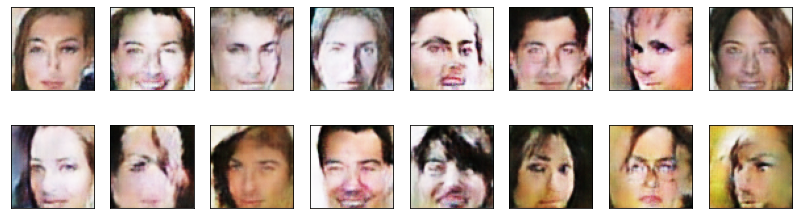

2024-05-11 19:40:30 | Epoch [50/50] | Batch 0/509 | d_loss: 1.3373 | g_loss: 0.8678
2024-05-11 19:40:34 | Epoch [50/50] | Batch 50/509 | d_loss: 1.3200 | g_loss: 0.8498
2024-05-11 19:40:38 | Epoch [50/50] | Batch 100/509 | d_loss: 1.2693 | g_loss: 0.9123
2024-05-11 19:40:41 | Epoch [50/50] | Batch 150/509 | d_loss: 1.3819 | g_loss: 0.7711
2024-05-11 19:40:45 | Epoch [50/50] | Batch 200/509 | d_loss: 1.2917 | g_loss: 0.9011
2024-05-11 19:40:48 | Epoch [50/50] | Batch 250/509 | d_loss: 1.3041 | g_loss: 0.7827
2024-05-11 19:40:51 | Epoch [50/50] | Batch 300/509 | d_loss: 1.2643 | g_loss: 0.9529
2024-05-11 19:40:55 | Epoch [50/50] | Batch 350/509 | d_loss: 1.3952 | g_loss: 0.7670
2024-05-11 19:40:58 | Epoch [50/50] | Batch 400/509 | d_loss: 1.3353 | g_loss: 0.8855
2024-05-11 19:41:01 | Epoch [50/50] | Batch 450/509 | d_loss: 1.2848 | g_loss: 0.9489
2024-05-11 19:41:05 | Epoch [50/50] | Batch 500/509 | d_loss: 1.3449 | g_loss: 0.8822


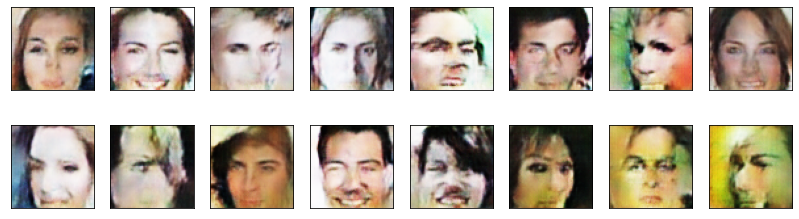

In [28]:
fixed_latent_vector = torch.randn(16, latent_dim, 1, 1).float().cuda()

losses = []
for epoch in range(n_epochs):
    for batch_i, real_images in enumerate(dataloader):
        real_images = real_images.to(device)
        
        ####################################
        
        # TODO: implement the training strategy
        
        ####################################
        
        # 1. train discriminator
        if batch_i % 2 == 0: 
            d_loss = discriminator_step(batch_size, latent_dim, real_images)
            
        # 2. train generator
        g_loss = generator_step(batch_size, latent_dim)
        
        if batch_i % print_every == 0:
            # append discriminator loss and generator loss
            d = d_loss['loss'].item()
            g = g_loss['loss'].item()
            losses.append((d, g))
            # print discriminator and generator loss
            time = str(datetime.now()).split('.')[0]
            print(f'{time} | Epoch [{epoch+1}/{n_epochs}] | Batch {batch_i}/{len(dataloader)} | d_loss: {d:.4f} | g_loss: {g:.4f}')
    
    # display images during training
    generator.eval()
    generated_images = generator(fixed_latent_vector)
    display(generated_images)
    generator.train()

### Training losses

Plot the training losses for the generator and discriminator.

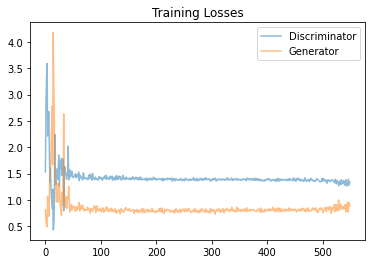

In [29]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

### Question: What do you notice about your generated samples and how might you improve this model?
When you answer this question, consider the following factors:
* The dataset is biased; it is made of "celebrity" faces that are mostly white
* Model size; larger models have the opportunity to learn more features in a data feature space
* Optimization strategy; optimizers and number of epochs affect your final result
* Loss functions

**Answer:** 
- usage of bigger dataset could be better as well as a more biased dataset, e.g. African people, Asian people
- best thing for me was optimizing of the DatasetDirectory-(Dataset-) class, as it improved the speed to load the data. In the beginning (before optimization) it took almost 20 hours (!) to finish the whole process.
- after this, optimization of learning rate and number of epochs (I tried up to 100 epochs) was a proper way to improve the quality of the generated pictures. 
- At some stage my Discriminator and Generator Network went a bit crazy. Plotting the training losses showed a huge volatility. But I handled this problem...

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb".  

Submit the notebook using the ***SUBMIT*** button in the bottom right corner of the Project Workspace.